# ESTUDO DE CASO: BURACOS NEGROS (Parte 2)

## SOBRE A PARTE 2

Assim como a parte 1, o objetivo desse estudo é aprimorar os conhecimentos em astrofísica e ciência de dados, além de treinar técnicas de escrita e de storytelling. Sei que as técnicas utilizadas aqui não são as mais avançadas, logicamente, pois sou apenas um entusiasta desse campo magnífico, mas é uma maneira de armazenar no "meu HD" todo o conhecimento obtido com essa prática.

## OBJETIVOS

O objetivo desse projeto é treinar um modelo de rede neural conhecido como autoencoder para reconstruir imagens de buracos negros. Para isso, o código realiza diversas etapas:

1. **Carregamento e Processamento de Imagens:** Primeiro, o código carrega e processa as imagens de buracos negros, dividindo-as em conjuntos de treinamento e transformação. Essas imagens são normalizadas para facilitar o treinamento da rede neural.

2. **Definição e Compilação do Modelo de Autoencoder:** Em seguida, o modelo de autoencoder é definido e compilado. O autoencoder consiste em duas partes principais: o codificador, que reduz a dimensionalidade das imagens de entrada, e o decodificador, que reconstrói as imagens a partir da representação reduzida gerada pelo codificador.

3. **Treinamento com Monitoramento de Desempenho:** Durante o treinamento do autoencoder, são utilizados callbacks para monitorar o desempenho do modelo e ajustar dinamicamente a taxa de aprendizado. Isso é importante para garantir que o modelo esteja aprendendo de forma eficaz e evitando o overfitting.

4. **Reconstrução e Visualização das Imagens:** Após o treinamento, o código realiza a reconstrução das imagens de buracos negros utilizando o modelo de autoencoder. As imagens originais e suas reconstruções são visualizadas, permitindo uma avaliação do desempenho do modelo.

Em resumo, treinamos um modelo de autoencoder para reconstruir imagens de buracos negros e avaliar sua capacidade de reproduzir com precisão as características das imagens originais. Essa tarefa é crucial para entender melhor os buracos negros e explorar os dados observacionais fornecidos por instrumentos como o Event Horizon Telescope (EHT), que busca obter imagens diretas do ambiente próximo a esses objetos cósmicos.

## O CÓDIGO

### Pacotes e bibliotecas

> Nesse código eu usei a versão 3.11.5 do Python, pois a mais recente era 3.12 que não aceita o Tensorflow.

Um aviso aos navegantes:

Tenham muita paciência nessa etapa. Foram 2 dias inteiros testando pacotes e versões, instalações e desinstalações, xícaras de café, desespero e vontade de jogar tudo fora.
No final, deu certo e até tive certa vontade de estourar um champagne, ainda bem que não o tinha.

Abaixo estão alguns dos pacotes que foram instalados e que ajudaram a rodar o código, mas caso algum apresente problemas, sugiro o [StackOverflow](https://stackoverflow.com/) 

In [47]:
# !pip install pyarrow
# !pip install tensorflow
# !pip install --upgrade tensorflow
# !python -m pip install --upgrade pip
# !pip install tf-nightly
# !pip install nibabel
# !pip install --upgrade keras
# !pip install opencv-python

Sim, são muitas bibliotecas, e essas fornecem uma variedade de funcionalidades para manipulação de dados, processamento de imagem, construção de modelos de aprendizado de máquina e visualização de resultados.

In [136]:
# ======= Bibliotecas base

import pandas as pd  # Manipulação e análise de dados tabulares
import numpy as np  # Computação numérica eficiente
import seaborn as sns  # Visualização de dados estatísticos
import matplotlib.pyplot as plt  # Biblioteca de plotagem de gráficos
import matplotlib as mpl  # Configurações adicionais para o Matplotlib
import random  # Geração de números aleatórios
import time  # Medição de tempo de execução

# ======= Operações relacionadas ao sistema de arquivos e manipulação de caminhos
import os
import os.path
from pathlib import Path
import glob
from scipy.io import loadmat  # Leitura de arquivos MATLAB
import nibabel as nib  # Leitura de arquivos de imagem médica no formato NIfTI
import csv  # Manipulação de arquivos CSV

# ======= Processamento de imagem
from PIL import Image
from keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import cv2  # OpenCV para processamento de imagem
from keras.applications.vgg16 import preprocess_input, decode_predictions
from keras.preprocessing import image
from skimage.feature import hessian_matrix, hessian_matrix_eigvals
from scipy.ndimage import convolve  # Operação de convolução
from skimage import data, io, filters
import skimage
from skimage.morphology import convex_hull_image, erosion
from IPython import display
from scipy.ndimage import gaussian_filter
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
import matplotlib.patches as patches

# ======= Escalonamento e transformações
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from keras.utils import to_categorical  # Conversão de rótulos em codificação one-hot
from sklearn.model_selection import train_test_split
from keras import regularizers
from sklearn.preprocessing import LabelEncoder  # Codificação de rótulos categóricos

# ======= Controle de acurácia
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report, roc_auc_score, roc_curve
from sklearn.model_selection import GridSearchCV, cross_val_score
from sklearn.metrics import mean_squared_error, r2_score

# ======= Otimizadores
from keras.optimizers import RMSprop, Adam, SGD, Optimizer

# ======= Camadas e modelos para construção de redes neurais
from tensorflow.keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPool2D, BatchNormalization, MaxPooling2D, BatchNormalization,\
                        Permute, TimeDistributed, Bidirectional, GRU, SimpleRNN,\
                        LSTM, GlobalAveragePooling2D, SeparableConv2D, ZeroPadding2D, Convolution2D, ZeroPadding2D, Reshape, Conv2DTranspose,\
                        LeakyReLU, GaussianNoise, GlobalMaxPooling2D, ReLU, Input, Concatenate
from keras import models
from keras import layers
import tensorflow as tf
from keras.applications import VGG16, VGG19, inception_v3
from keras import backend as K
from keras.utils import plot_model
from keras.datasets import mnist
import keras
from keras.models import Model

# ======= Ignorar mensagens de aviso durante a execução
from warnings import filterwarnings
filterwarnings("ignore", category=DeprecationWarning)
filterwarnings("ignore", category=FutureWarning) 
filterwarnings("ignore", category=UserWarning)

### 1.0 OBTENDO OS ARQUIVOS

Foram obtidos arquivos de mídias em formato de vídeo como .MP4 e .MOV e os colocamos no diretório atual de trabalho, então definimos o caminho completo para a referida pasta com as simulações chamada "Simulacoes" dentro desse diretório. Então criamos uma lista e imprimimos os caminhos de todos os arquivos MP4 e MOV presentes nessa pasta. O objetivo é mostrar informações sobre os vídeos disponíveis nesse contexto específico.

In [49]:
# Obtém a pasta atual de trabalho
diretorio_raiz = Path.cwd()

# Define o caminho completo para a pasta com os vídeos
diretorio_videos = diretorio_raiz / "Simulacoes"

# Obtém os caminhos dos arquivos MP4
arquivos_mp4 = list(diretorio_videos.glob("*.mp4"))

# Adiciona os caminhos dos arquivos MOV à lista
arquivos_mp4 += list(diretorio_videos.glob("*.mov"))

# Imprime o comprimento da lista e os primeiros elementos
print("LEN VIDEO LIST: ", len(arquivos_mp4))

# Cria uma série pandas com os caminhos dos vídeos
serie_videos = pd.Series(arquivos_mp4, name="VIDEO").astype(str)

# Imprime os primeiros elementos da série
print(serie_videos.head(-1))

# Imprime elementos específicos da série
print(serie_videos[0])
print("---" * 10)
print(serie_videos[2])
print("---" * 10)
print(serie_videos[7])

LEN VIDEO LIST:  9
0    c:\Users\jonat\OneDrive\___ÁREA DE TRABALHO\As...
1    c:\Users\jonat\OneDrive\___ÁREA DE TRABALHO\As...
2    c:\Users\jonat\OneDrive\___ÁREA DE TRABALHO\As...
3    c:\Users\jonat\OneDrive\___ÁREA DE TRABALHO\As...
4    c:\Users\jonat\OneDrive\___ÁREA DE TRABALHO\As...
5    c:\Users\jonat\OneDrive\___ÁREA DE TRABALHO\As...
6    c:\Users\jonat\OneDrive\___ÁREA DE TRABALHO\As...
7    c:\Users\jonat\OneDrive\___ÁREA DE TRABALHO\As...
Name: VIDEO, dtype: object
c:\Users\jonat\OneDrive\___ÁREA DE TRABALHO\Astronomia\Buracos Negros\Simulacoes\1 mm Wavelength.mp4
------------------------------
c:\Users\jonat\OneDrive\___ÁREA DE TRABALHO\Astronomia\Buracos Negros\Simulacoes\1 mm Wavelength_III.mp4
------------------------------
c:\Users\jonat\OneDrive\___ÁREA DE TRABALHO\Astronomia\Buracos Negros\Simulacoes\Varying Wavelength.mp4


### 2.0 TRANSFORMAÇÃO

O objetivo principal desse código é realizar o pré-processamento de vídeos de buracos negros para prepará-los para o treinamento de modelos de reconstrução de imagens, como um autoencoder. Alguns etapas para esse pré-processamento:

1. **Padronização de formato:** Os vídeos podem estar em diferentes formatos e resoluções. Converter todos os quadros para o formato RGB e redimensioná-los para uma resolução fixa (180x180 pixels neste caso) garante que todos os dados de entrada para o modelo de reconstrução tenham o mesmo formato, facilitando o processamento e reduzindo a complexidade do modelo.

2. **Redução da dimensionalidade:** Redimensionar os quadros para uma resolução menor reduz a dimensionalidade dos dados, o que pode ser útil para reduzir o tempo de treinamento do modelo e minimizar o risco de overfitting.

3. **Compatibilidade com bibliotecas de aprendizado profundo:** Muitas bibliotecas de aprendizado profundo, como TensorFlow e PyTorch, trabalham com imagens em formato RGB e esperam entradas de tamanho fixo. Portanto, converter os quadros para o formato RGB e redimensioná-los para uma resolução específica os torna compatíveis com essas bibliotecas.

4. **Preparação para o treinamento do modelo:** Ao realizar esse pré-processamento, os quadros dos vídeos são preparados de uma forma que é mais adequada para o treinamento de modelos de reconstrução de imagens. Isso inclui modelos como autoencoders, que são capazes de aprender representações compactas das imagens e reconstruí-las com precisão.

Portanto, o código é essencial para garantir que os dados de entrada estejam em um formato adequado e otimizado para o treinamento eficaz do modelo de reconstrução de imagens de buracos negros.

In [50]:
# Lista para armazenar os quadros transformados dos vídeos
buraco_negro_img = []

# Loop sobre cada caminho de arquivo de vídeo na série serie_videos
for arquivo in serie_videos:
    # Obtém o caminho do arquivo de vídeo
    arquivo_video = arquivo
    
    # Abre o vídeo usando o OpenCV
    video_captura = cv2.VideoCapture(arquivo_video)
    
    # Entra em um loop enquanto o vídeo está aberto
    while video_captura.isOpened():
        
        # Lê cada quadro do vídeo
        _, frame = video_captura.read()
        
        # Verifica se a leitura do quadro foi bem-sucedida
        if _ != True:
            break
            
        # Converte o quadro de BGR para RGB
        img_convertida = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        
        # Redimensiona o quadro para 180x180 pixels usando interpolação cúbica
        img_redimensionada = cv2.resize(img_convertida, (180, 180), interpolation=cv2.INTER_CUBIC)
        
        # Adiciona o quadro transformado e redimensionado à lista buraco_negro_img
        buraco_negro_img.append(img_redimensionada)


In [51]:
# Imprime o comprimento da lista buraco_negro_img
print("TAMANHO DA LISTA: ", len(buraco_negro_img))

# Converte a lista em uma matriz NumPy e imprime suas dimensões
print("TAMANHO DO ARRAY: ", np.shape(np.array(buraco_negro_img)))

TAMANHO DA LISTA:  7535
TAMANHO DO ARRAY:  (7535, 180, 180, 3)


Criamos uma lista que armazena os quadros transformados dos vídeos de buracos negros após o pré-processamento. Os valores dentro dos colchetes são índices que indicam qual quadro específico será exibido em cada subplot o que permite uma visualização dos quadros transformados e pré-processados. 

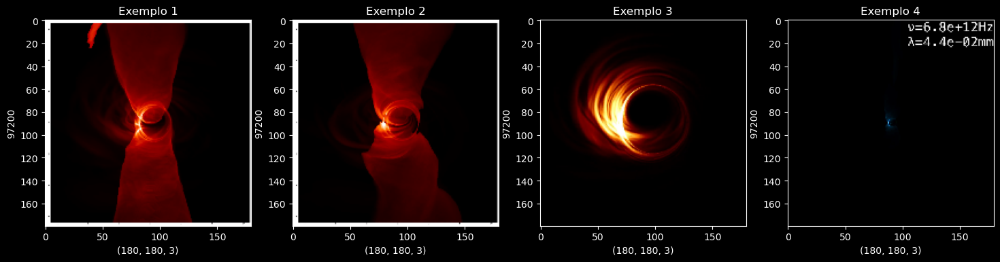

In [52]:
# Configuração do estilo de fundo do gráfico
plt.style.use("dark_background")

# Cria uma figura com quatro subplots em uma única linha
figure, axis = plt.subplots(1, 4, figsize=(18, 18))

# Configurações e exibição da primeira imagem
axis[0].set_xlabel(buraco_negro_img[0].shape)
axis[0].set_ylabel(buraco_negro_img[0].size)
axis[0].set_title("Exemplo 1")
axis[0].imshow(buraco_negro_img[0])

# Configurações e exibição da segunda imagem
axis[1].set_xlabel(buraco_negro_img[567].shape)
axis[1].set_ylabel(buraco_negro_img[567].size)
axis[1].set_title("Exemplo 2")
axis[1].imshow(buraco_negro_img[567])

# Configurações e exibição da terceira imagem
axis[2].set_xlabel(buraco_negro_img[3400].shape)
axis[2].set_ylabel(buraco_negro_img[3400].size)
axis[2].set_title("Exemplo 3")
axis[2].imshow(buraco_negro_img[3400])

# Configurações e exibição da quarta imagem
axis[3].set_xlabel(buraco_negro_img[7000].shape)
axis[3].set_ylabel(buraco_negro_img[7000].size)
axis[3].set_title("Exemplo 4")
axis[3].imshow(buraco_negro_img[7000])

### 3.0 DISCO DE ACREÇÃO

Como explicado na parte 1 desse estudo, um disco de acreção é uma estrutura em forma de disco composta por gás, poeira e outros detritos que orbitam em torno de um objeto compacto, como uma estrela de nêutrons ou um buraco negro. Esses detritos são atraídos pela forte gravidade do objeto central e gradualmente se acumulam em um disco antes de serem consumidos pelo objeto.

A formação de um disco de acreção ocorre quando a matéria em órbita ao redor do objeto central perde energia cinética devido à fricção entre as partículas do disco. Conforme essa energia é dissipada, as partículas do disco espiralam em direção ao objeto central, formando o disco de acreção.

Os discos de acreção são fontes significativas de energia eletromagnética, emitindo radiação em uma ampla variedade de comprimentos de onda, desde raios-X até ondas de rádio. Isso ocorre porque a matéria no disco é aquecida pela fricção e pela compressão à medida que se aproxima do objeto central, gerando enormes quantidades de energia que são liberadas na forma de radiação.

Esses discos desempenham um papel fundamental em muitos fenômenos astrofísicos, incluindo a alimentação de buracos negros supermassivos no centro de galáxias ativas, a formação de sistemas estelares binários e a produção de jatos relativísticos de matéria que são observados em muitos objetos compactos. Em resumo, os discos de acreção são importantes laboratórios naturais para estudar os processos físicos extremos que ocorrem perto de objetos compactos no universo.

O código abaixo é para processar um vídeo que representa um disco de acreção. Ele transforma cada quadro do vídeo em imagens RGB redimensionadas e armazena essas imagens em uma lista chamada `acrecao_lista`. Essas imagens podem ser posteriormente usadas para análise ou visualização do disco de acreção.

In [53]:
# Caminho do arquivo de vídeo para o disco de acreção
dir_disco_acrecao = "Simulacoes/Accretion Disk.mp4"

# Lista para armazenar os quadros transformados do vídeo do disco de acreção
acrecao_lista = []

# Abre o vídeo usando o OpenCV
acrecao_video = cv2.VideoCapture(dir_disco_acrecao)

# Entra em um loop enquanto o vídeo está aberto
while acrecao_video.isOpened():
    
    # Lê cada quadro do vídeo
    _, frame = acrecao_video.read()
    
    # Verifica se a leitura do quadro foi bem-sucedida
    if _ != True:
        break
        
    # Converte o quadro de BGR para RGB
    img_convertida = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    
    # Redimensiona o quadro para 180x180 pixels usando interpolação cúbica
    img_redimensionada = cv2.resize(img_convertida, (180, 180), interpolation=cv2.INTER_CUBIC)
    
    # Adiciona o quadro transformado e redimensionado à lista acrecao_lista
    acrecao_lista.append(img_redimensionada)

In [54]:
# Imprime o comprimento da lista acrecao_lista e as dimensões da matriz NumPy
print("TAMANHO DA LISTA: ", len(acrecao_lista))
print("TAMANHO DO ARRAY: ", np.shape(np.array(acrecao_lista)))

TAMANHO DA LISTA:  513
TAMANHO DO ARRAY:  (513, 180, 180, 3)


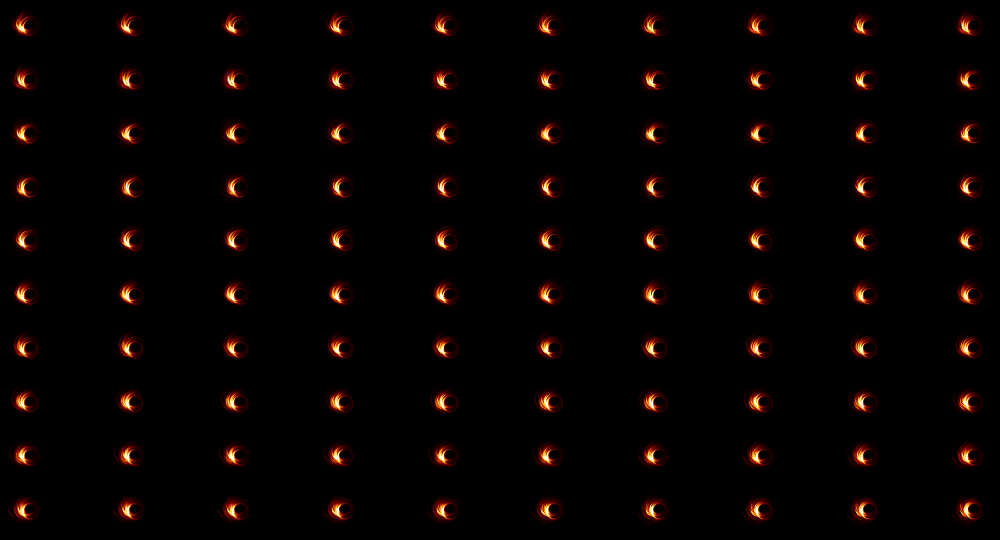

In [55]:
# Cria uma grade de subplots com 10 linhas e 10 colunas, totalizando 100 subplots
figure, axis = plt.subplots(10, 10, figsize=(20, 10))

# Itera sobre os subplots usando enumerate para obter o índice (indexing) e o subplot (operations)
for indexing, operations in enumerate(axis.flat):
    
    # Calcula o índice correspondente na lista acrecao_lista, multiplicando por 5
    # Isso pode resultar em índices fora do alcance se a lista não for múltiplo de 5
    indice_acrecao = acrecao_lista[indexing * 5]
    
    # Exibe a imagem no subplot atual
    operations.imshow(indice_acrecao)
    
    # Desativa os eixos para melhor visualização
    operations.axis("off")

# Ajusta o layout para garantir que os subplots estejam bem espaçados
plt.tight_layout()

# Exibe a figura com os subplots
plt.show()

No contexto, aqui nos permite visualizar simulações computacionais ou observações reais de buracos negros. As imagens dos buracos negros podem ser obtidas a partir de simulações numéricas, modelos teóricos ou dados observacionais de telescópios. Ele cria uma grade de subplots para exibir imagens relacionadas a buracos negros, facilitando a análise e comparação entre elas.

- Análise de Dados de Eventos Astronômicos: Pode ser usado para analisar e examinar detalhadamente os dados obtidos de eventos astronômicos relacionados a buracos negros, como fusões de buracos negros, emissão de radiação de discos de acreção ou interações com estrelas vizinhas.

- Estudo da Estrutura e Comportamento dos Buracos Negros: O código pode ajudar na investigação da estrutura e do comportamento dos buracos negros, permitindo a visualização de diferentes características, como a forma do horizonte de eventos, a emissão de radiação de um disco de acreção ou a presença de jatos relativísticos.

- Comunicação Científica e Educação: Também pode ser utilizado para comunicar conceitos científicos relacionados a buracos negros de forma visualmente impactante, tanto para a comunidade científica quanto para o público em geral, contribuindo para a divulgação científica e a educação em astronomia e astrofísica.

### 4.0 DESMISTIFICANDO OS LIMIARES

Aqui queremos visualizar diferentes técnicas de limiarização aplicadas a uma imagem em escala de cinza. Ele exibe cinco imagens em uma única figura, onde a primeira imagem é a imagem original em escala de cinza e as outras quatro são as imagens resultantes de diferentes técnicas de limiarização:

1. **limiar_zero**:
   - Nesta técnica, os pixels da imagem que têm intensidade menor que o valor de limiar são definidos como zero (preto). Pixels com intensidade maior ou igual ao valor de limiar são mantidos sem alteração.
   - Em outras palavras, essa técnica transforma todos os pixels abaixo do valor de limiar em preto, enquanto os pixels acima ou iguais ao valor de limiar permanecem inalterados.

2. **limiar_zero_INV (Limiar para Zero Invertido)**:
   - É o oposto da técnica TOZERO. Aqui, os pixels da imagem que têm intensidade maior que o valor de limiar são definidos como zero (preto), e os pixels com intensidade menor ou igual ao valor de limiar são mantidos sem alteração.
   - Em resumo, esta técnica transforma todos os pixels acima do valor de limiar em preto, enquanto os pixels abaixo ou iguais ao valor de limiar permanecem inalterados.

3. **limiar_binario**:
   - Nesta técnica, os pixels da imagem que têm intensidade menor que o valor de limiar são definidos como 0 (preto), e os pixels com intensidade maior ou igual ao valor de limiar são definidos como 255 (branco).
   - Esta técnica binariza a imagem, transformando todos os pixels abaixo do valor de limiar em preto e todos os pixels acima ou iguais ao valor de limiar em branco.

4. **limiar_binario_INV (Limiar Binário Invertido)**:
   - É o oposto da técnica BINARY. Aqui, os pixels da imagem que têm intensidade menor que o valor de limiar são definidos como 255 (branco), e os pixels com intensidade maior ou igual ao valor de limiar são definidos como 0 (preto).
   - Ou seja, esta técnica binariza a imagem de forma invertida, transformando todos os pixels abaixo do valor de limiar em branco e todos os pixels acima ou iguais ao valor de limiar em preto.


**Por que isso foi feito?** <br>
Essas técnicas são comumente usadas em processamento de imagens para segmentar objetos de interesse ou realçar certas características na imagem.

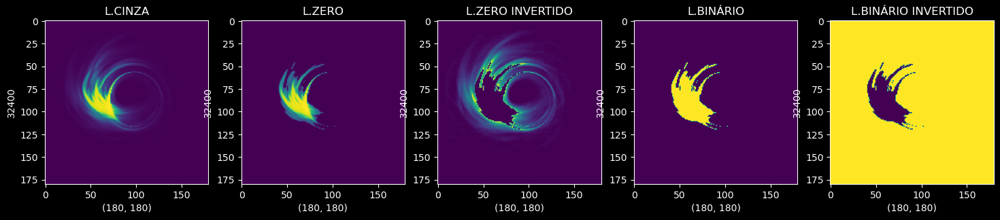

In [56]:
# Cria uma figura com 1 linha e 5 colunas, definindo o tamanho da figura
figure, axis = plt.subplots(1, 5, figsize=(18, 18))

# Seleciona a segunda imagem da lista 'acrecao_lista' (supondo que esta lista já tenha sido definida)
indice_acrecao = acrecao_lista[1]

# Converte a imagem RGB em escala de cinza
img_cinza = cv2.cvtColor(indice_acrecao, cv2.COLOR_RGB2GRAY)

# Aplica diferentes técnicas de limiarização (thresholding) na imagem em escala de cinza
_, limiar_zero = cv2.threshold(img_cinza, 55, 255, cv2.THRESH_TOZERO)
_, limiar_zero_invertido = cv2.threshold(img_cinza, 55, 255, cv2.THRESH_TOZERO_INV)
_, limiar_binario = cv2.threshold(img_cinza, 55, 255, cv2.THRESH_BINARY)
_, limiar_binario_invertido = cv2.threshold(img_cinza, 55, 255, cv2.THRESH_BINARY_INV)

# Configurações e plotagem da primeira imagem (escala de cinza)
axis[0].set_xlabel(img_cinza.shape)
axis[0].set_ylabel(img_cinza.size)
axis[0].set_title("L.CINZA")
axis[0].imshow(img_cinza)

# Configurações e plotagem da segunda imagem 
axis[1].set_xlabel(limiar_zero.shape)
axis[1].set_ylabel(limiar_zero.size)
axis[1].set_title("L.ZERO")
axis[1].imshow(limiar_zero)

# Configurações e plotagem da terceira imagem 
axis[2].set_xlabel(limiar_zero_invertido.shape)
axis[2].set_ylabel(limiar_zero_invertido.size)
axis[2].set_title("L.ZERO INVERTIDO")
axis[2].imshow(limiar_zero_invertido)

# Configurações e plotagem da quarta imagem 
axis[3].set_xlabel(limiar_binario.shape)
axis[3].set_ylabel(limiar_binario.size)
axis[3].set_title("L.BINÁRIO")
axis[3].imshow(limiar_binario)

# Configurações e plotagem da quinta imagem
axis[4].set_xlabel(limiar_binario_invertido.shape)
axis[4].set_ylabel(limiar_binario_invertido.size)
axis[4].set_title("L.BINÁRIO INVERTIDO")
axis[4].imshow(limiar_binario_invertido)

# Exibe a figura com as imagens plotadas
plt.show()

Como você pode ver, esse código é semelhante ao código anterior, mas utiliza diferentes mapas de cores para exibir as imagens. Os mapas de cores "hot" são usados para ressaltar regiões de alta intensidade, enquanto o mapa de cor "gray" é usado para exibir imagens em escala de cinza padrão. Os resultados das técnicas de limiarização são plotados em cinco subplots diferentes, cada um com seu título e rótulos de eixo configurados.

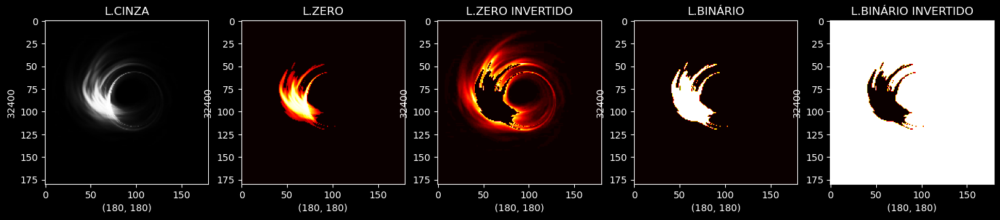

In [57]:
# Cria uma figura com 1 linha e 5 colunas, definindo o tamanho da figura
figure, axis = plt.subplots(1, 5, figsize=(18, 18))

# Seleciona a segunda imagem da lista 'acrecao_lista' (supondo que esta lista já tenha sido definida)
indice_acrecao = acrecao_lista[1]

# Converte a imagem RGB em escala de cinza
img_cinza = cv2.cvtColor(indice_acrecao, cv2.COLOR_RGB2GRAY)

# Aplica diferentes técnicas de limiarização (thresholding) na imagem em escala de cinza
_, limiar_zero = cv2.threshold(img_cinza, 55, 255, cv2.THRESH_TOZERO)
_, limiar_zero_invertido = cv2.threshold(img_cinza, 55, 255, cv2.THRESH_TOZERO_INV)
_, limiar_binario = cv2.threshold(img_cinza, 55, 255, cv2.THRESH_BINARY)
_, limiar_binario_invertido = cv2.threshold(img_cinza, 55, 255, cv2.THRESH_BINARY_INV)

# Configurações e plotagem da primeira imagem (escala de cinza)
axis[0].set_xlabel(img_cinza.shape)
axis[0].set_ylabel(img_cinza.size)
axis[0].set_title("L.CINZA")
axis[0].imshow(img_cinza, cmap="gray")  # cmap="gray" define a escala de cinza para a imagem

# Configurações e plotagem da segunda imagem
axis[1].set_xlabel(limiar_zero.shape)
axis[1].set_ylabel(limiar_zero.size)
axis[1].set_title("L.ZERO")
axis[1].imshow(limiar_zero, cmap="hot")  # cmap="hot" define a paleta de cores quente para a imagem

# Configurações e plotagem da terceira imagem 
axis[2].set_xlabel(limiar_zero_invertido.shape)
axis[2].set_ylabel(limiar_zero_invertido.size)
axis[2].set_title("L.ZERO INVERTIDO")
axis[2].imshow(limiar_zero_invertido, cmap="hot")  # cmap="hot" define a paleta de cores quente para a imagem

# Configurações e plotagem da quarta imagem 
axis[3].set_xlabel(limiar_binario.shape)
axis[3].set_ylabel(limiar_binario.size)
axis[3].set_title("L.BINÁRIO")
axis[3].imshow(limiar_binario, cmap="hot")  # cmap="hot" define a paleta de cores quente para a imagem

# Configurações e plotagem da quinta imagem 
axis[4].set_xlabel(limiar_binario_invertido.shape)
axis[4].set_ylabel(limiar_binario_invertido.size)
axis[4].set_title("L.BINÁRIO INVERTIDO")
axis[4].imshow(limiar_binario_invertido, cmap="hot")  # cmap="hot" define a paleta de cores quente para a imagem
plt.show()

Já nesse código, usamos outras técnicas para segmentar objetos de interesse em imagens em escala de cinza:

1. **limiar_otsu**:
   - O método de limiarização de Otsu é uma técnica automática de seleção de limiar. Ele calcula o valor ótimo de limiarização para binarizar uma imagem em escala de cinza de forma a minimizar a variância intra-classe (variância dentro das classes de pixels separadas pelo limiar) e maximizar a variância inter-classe (variância entre as classes de pixels separadas pelo limiar).
   - O limiar de Otsu é calculado usando a distribuição de intensidade de pixels na imagem. Uma vez calculado, esse limiar é aplicado para segmentar a imagem em duas regiões: uma que será definida como 0 (preto) e outra que será definida como 255 (branco), dependendo se o pixel tem uma intensidade menor ou maior que o limiar, respectivamente.

2. **limiar_triangular**:
   - O método de limiarização de Triângulo é outra técnica automática de seleção de limiar. Ele calcula um limiar baseado na distribuição de intensidade dos pixels, utilizando o conceito geométrico de um triângulo formado pelas distribuições de intensidade em cada lado.
   - O limiar é escolhido de forma a maximizar a distância entre o ponto médio do histogramaa e a linha que liga o ponto médio ao ponto de interseção entre as duas tangentes ao histogramaaaaaaa nos pontos de menor e maior intensidade. Esse limiar é então aplicado para segmentar a imagem em duas regiões, da mesma maneira que no método de Otsu.

3. **imiar_truncado**:
   - Neste método de limiarização, os pixels na imagem que têm intensidades maiores que o valor de limiar são definidos com um valor fixo (o valor de limiar), enquanto os pixels com intensidades menores que o valor de limiar são mantidos sem alteração.
   - Em outras palavras, este método define todos os pixels com intensidade menor que o valor de limiar como preto, enquanto os pixels com intensidade maior ou igual ao valor de limiar permanecem com a intensidade original.
   - Este método é útil para realçar características específicas na imagem que têm intensidades acima de um certo limiar, enquanto o restante da imagem permanece inalterado.

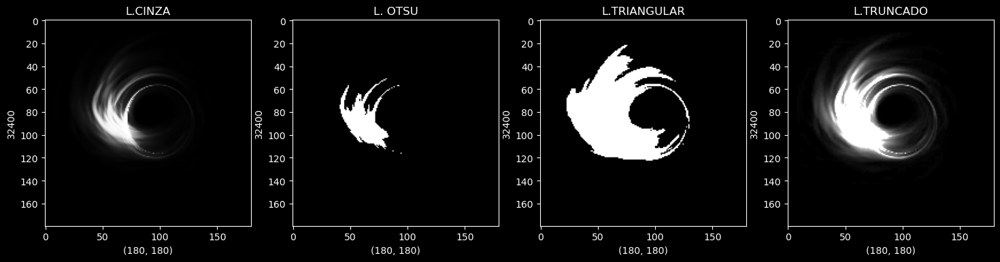

In [58]:
figure, axis = plt.subplots(1, 4, figsize=(18, 18))

# Segunda imagem da lista
indice_acrecao = acrecao_lista[1]

# RGB em escala de cinza
img_cinza = cv2.cvtColor(indice_acrecao, cv2.COLOR_RGB2GRAY)

# Limiarização 
_, limiar_OTSU = cv2.threshold(img_cinza, 55, 255, cv2.THRESH_OTSU)
_, limiar_triangular = cv2.threshold(img_cinza, 55, 255, cv2.THRESH_TRIANGLE)
_, limiar_truncado = cv2.threshold(img_cinza, 55, 255, cv2.THRESH_TRUNC)

axis[0].set_xlabel(img_cinza.shape)
axis[0].set_ylabel(img_cinza.size)
axis[0].set_title("L.CINZA")
axis[0].imshow(img_cinza, cmap="gray")  # cmap="gray" define a escala de cinza para a imagem

axis[1].set_xlabel(limiar_OTSU.shape)
axis[1].set_ylabel(limiar_OTSU.size)
axis[1].set_title("L. OTSU")
axis[1].imshow(limiar_OTSU, cmap="gray")  # cmap="gray" define a escala de cinza para a imagem

axis[2].set_xlabel(limiar_triangular.shape)
axis[2].set_ylabel(limiar_triangular.size)
axis[2].set_title("L.TRIANGULAR")
axis[2].imshow(limiar_triangular, cmap="gray")  # cmap="gray" define a escala de cinza para a imagem

# Configurações e plotagem da quarta imagem 
axis[3].set_xlabel(limiar_truncado.shape)
axis[3].set_ylabel(limiar_truncado.size)
axis[3].set_title("L.TRUNCADO")
axis[3].imshow(limiar_truncado, cmap="gray")  # cmap="gray" define a escala de cinza para a imagem

plt.show()

Já esse, permite uma análise visual das diferentes versões da imagem do disco de acreção após a conversão para escala de cinza especificamente e a aplicação de diferentes métodos de limiarização. Isso pode ajudar a destacar regiões de interesse na imagem e facilitar a interpretação dos dados.

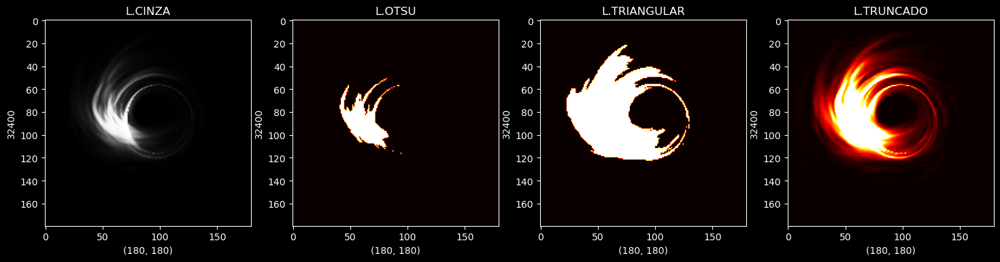

In [59]:
figure, axis = plt.subplots(1, 4, figsize=(18, 18))

indice_acrecao = acrecao_lista[1]
img_cinza = cv2.cvtColor(indice_acrecao, cv2.COLOR_RGB2GRAY)

_, limiar_OTSU = cv2.threshold(img_cinza, 55, 255, cv2.THRESH_OTSU)
_, limiar_triangular = cv2.threshold(img_cinza, 55, 255, cv2.THRESH_TRIANGLE)
_, limiar_truncado = cv2.threshold(img_cinza, 55, 255, cv2.THRESH_TRUNC)

axis[0].set_xlabel(img_cinza.shape)
axis[0].set_ylabel(img_cinza.size)
axis[0].set_title("L.CINZA")
axis[0].imshow(img_cinza, cmap="gray")  # cmap="gray" define a escala de cinza para a imagem

axis[1].set_xlabel(limiar_OTSU.shape)
axis[1].set_ylabel(limiar_OTSU.size)
axis[1].set_title("L.OTSU")
axis[1].imshow(limiar_OTSU, cmap="hot")  # cmap="hot" define a paleta de cores quente para a imagem

axis[2].set_xlabel(limiar_triangular.shape)
axis[2].set_ylabel(limiar_triangular.size)
axis[2].set_title("L.TRIANGULAR")
axis[2].imshow(limiar_triangular, cmap="hot")  # cmap="hot" define a paleta de cores quente para a imagem

axis[3].set_xlabel(limiar_truncado.shape)
axis[3].set_ylabel(limiar_truncado.size)
axis[3].set_title("L.TRUNCADO")
axis[3].imshow(limiar_truncado, cmap="hot")  # cmap="hot" define a paleta de cores quente para a imagem
plt.show()

No método de limiarização de Limiar Truncado (L.TRUNCADO), os pixels na imagem que têm intensidades maiores que o valor de limiar são definidos com um valor fixo, enquanto os pixels com intensidades menores que o valor de limiar permanecem com a intensidade original. A paleta de cores "hot" é escolhida para representar esta imagem, onde os valores mais altos (brancos) indicam as regiões onde o limiar foi aplicado e os valores mais baixos (tons mais escuros) representam os pixels mantidos inalterados.

### 5.0 TIPO CANNY

Este código realizamos as seguintes operações:

1. **Conversão para Escala de Cinza**:
   - Convertemos a imagem colorida `indice_acrecao` em escala de cinza usando `cv2.cvtColor()` e armazenamos a imagem resultante em `img_cinza`

2. **Limiarização Truncada**:
   - Aplicamos a técnica de limiarização truncada na imagem em escala de cinza `img_cinza` usando `cv2.threshold()`
   - O valor de limiar é definido como 220, o valor máximo é 255, e todos os valores maiores que 220 são definidos como 220
   - Armazenamos a imagem resultante em `limiar_truncado`

3. **Detecção de Bordas com Canny**:
   - Aplicamos o detector de bordas Canny na imagem limiarizada `limiar_truncado` usando `cv2.Canny()`
   - Os parâmetros 55 e 100 são usados para os limiares de gradiente mínimo e máximo, respectivamente
   - Armazenamos a imagem resultante em `Canny_IMG`

4. **Plotagem das Imagens**:
   - Cria uma figura com 1 linha e 3 colunas usando `plt.subplots()` e define o tamanho da figura como (18, 18)
   - Plotamos a imagem em escala de cinza original e limiarizada truncada 
   - Plotamos a imagem resultante da detecção de bordas Canny (`Canny_IMG`) no terceiro subplot


**Bordas de Canny**<br>
A detecção de bordas de Canny foi desenvolvida por John F. Canny em 1986. É uma técnica amplamente usada para identificar bordas em imagens. O algoritmo de Canny opera em várias etapas, incluindo suavização da imagem para reduzir o ruído, cálculo do gradiente para encontrar áreas de maior variação de intensidade e aplicação de um algoritmo de supressão de não máximos e de limiares para identificar as bordas finais. Esta técnica é reconhecida pela sua capacidade de produzir bordas nítidas e precisas em imagens com uma baixa taxa de detecção de ruído.

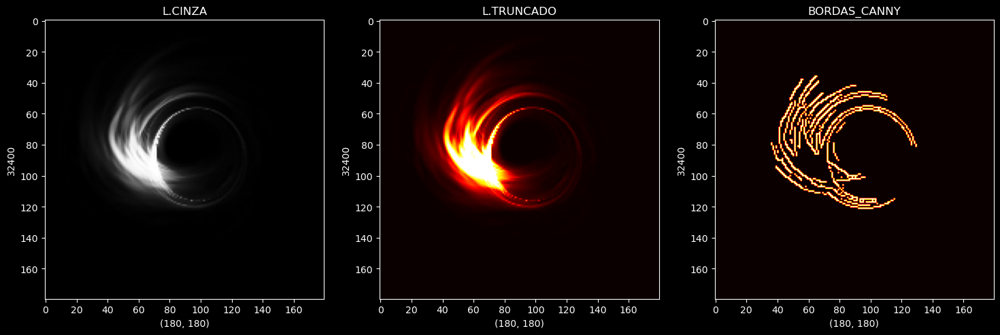

In [60]:
figure, axis = plt.subplots(1, 3, figsize=(18, 18))

indice_acrecao = acrecao_lista[1]
img_cinza = cv2.cvtColor(indice_acrecao, cv2.COLOR_RGB2GRAY)

# Aplica a técnica de limiarização truncada na imagem em escala de cinza
# Todos os valores de pixel acima de 220 são definidos como 220
_, limiar_truncado = cv2.threshold(img_cinza, 220, 255, cv2.THRESH_TRUNC)

# Aplica o detector de bordas Canny na imagem limiarizada truncada
# Os valores de gradiente mínimo e máximo são definidos como 55 e 100, respectivamente
Canny_IMG = cv2.Canny(limiar_truncado, 55, 100)

axis[0].set_xlabel(img_cinza.shape)
axis[0].set_ylabel(img_cinza.size)
axis[0].set_title("L.CINZA")
axis[0].imshow(img_cinza, cmap="gray")

axis[1].set_xlabel(limiar_truncado.shape)
axis[1].set_ylabel(limiar_truncado.size)
axis[1].set_title("L.TRUNCADO")
axis[1].imshow(limiar_truncado, cmap="hot") 

axis[2].set_xlabel(Canny_IMG.shape)
axis[2].set_ylabel(Canny_IMG.size)
axis[2].set_title("BORDAS_CANNY")
axis[2].imshow(Canny_IMG, cmap="hot")  
plt.show()

Aqui nesse código, fizemos o processamento de uma imagem de entrada para realizar a detecção de bordas usando o algoritmo de Canny. Primeiramente, convertemos a imagem colorida em escala de cinza, pois a detecção de bordas é mais eficaz nesse espaço de cor. Em seguida, aplicamos uma técnica de limiarização truncada para realçar as transições de intensidade na imagem. 

Com a imagem limiarizada, utilizamos o algoritmo de detecção de bordas Canny para identificar as bordas presentes na imagem. Finalmente, combinamos a imagem em escala de cinza original com as bordas detectadas, criando uma imagem que realça as bordas enquanto preserva as características da imagem original. 

As imagens resultantes são então exibidas para visualização, mostrando a imagem em escala de cinza original, as bordas detectadas pelo algoritmo de Canny e a imagem misturada que destaca as bordas.

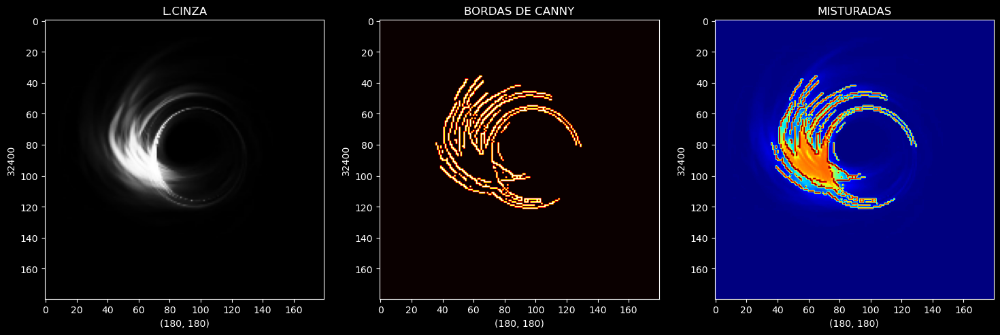

In [61]:
figure, axis = plt.subplots(1, 3, figsize=(18, 18))

indice_acrecao = acrecao_lista[1]
img_cinza = cv2.cvtColor(indice_acrecao, cv2.COLOR_RGB2GRAY)

# Aplica a técnica de limiarização truncada na imagem em escala de cinza
_, limiar_truncado = cv2.threshold(img_cinza, 220, 255, cv2.THRESH_TRUNC)

# Aplica o detector de bordas Canny na imagem limiarizada
Canny_IMG = cv2.Canny(limiar_truncado, 55, 100)

# Combina as imagens em escala de cinza original e a imagem resultante da detecção de bordas Canny
Blend_IMG = cv2.addWeighted(img_cinza, 0.8, Canny_IMG, 0.8, 0.1)

axis[0].set_xlabel(img_cinza.shape)
axis[0].set_ylabel(img_cinza.size)
axis[0].set_title("L.CINZA")
axis[0].imshow(img_cinza, cmap="gray")  

axis[1].set_xlabel(Canny_IMG.shape)
axis[1].set_ylabel(Canny_IMG.size)
axis[1].set_title("BORDAS DE CANNY")
axis[1].imshow(Canny_IMG, cmap="hot")  

axis[2].set_xlabel(Blend_IMG.shape)
axis[2].set_ylabel(Blend_IMG.size)
axis[2].set_title("MISTURADAS")
axis[2].imshow(Blend_IMG, cmap="jet")  
plt.show()

Neste código, convertemos uma imagem colorida em escala de cinza e aplicamos uma técnica de limiarização truncada para realçar transições de intensidade na imagem. Em seguida, detectamos as bordas usando o algoritmo de Canny. Posteriormente, calculamos a diferença absoluta entre a imagem em escala de cinza original e as bordas detectadas. Os resultados são exibidos em três subplots: a imagem em escala de cinza original, as bordas detectadas pelo algoritmo de Canny e a diferença absoluta entre elas.

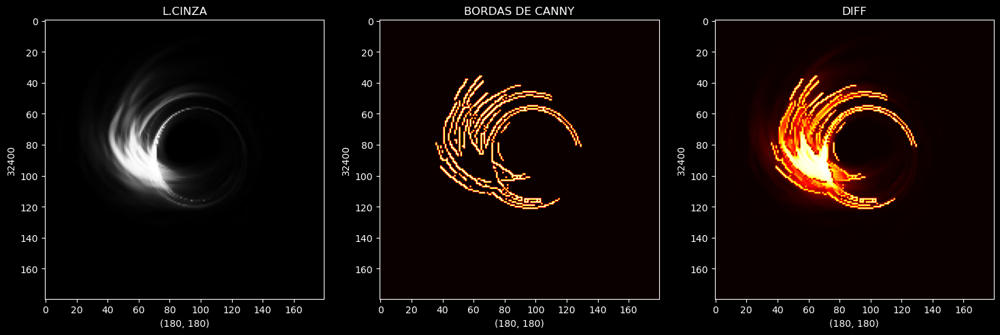

In [62]:
figure, axis = plt.subplots(1, 3, figsize=(18, 18))

indice_acrecao = acrecao_lista[1]
img_cinza = cv2.cvtColor(indice_acrecao, cv2.COLOR_RGB2GRAY)
_, limiar_truncado = cv2.threshold(img_cinza, 220, 255, cv2.THRESH_TRUNC)
Canny_IMG = cv2.Canny(limiar_truncado, 55, 100)

# Calcula a diferença absoluta entre a imagem em escala de cinza original e as bordas detectadas
Diff_Image = cv2.absdiff(img_cinza, Canny_IMG, np.zeros((2, 2)))

axis[0].set_xlabel(img_cinza.shape)
axis[0].set_ylabel(img_cinza.size)
axis[0].set_title("L.CINZA")
axis[0].imshow(img_cinza, cmap="gray")

axis[1].set_xlabel(Canny_IMG.shape)
axis[1].set_ylabel(Canny_IMG.size)
axis[1].set_title("BORDAS DE CANNY")
axis[1].imshow(Canny_IMG, cmap="hot")

axis[2].set_xlabel(Diff_Image.shape)
axis[2].set_ylabel(Diff_Image.size)
axis[2].set_title("DIFF")
axis[2].imshow(Diff_Image, cmap="hot")

plt.show()

### 6.0 EQUALIZAR HISTOGRAMA

Neste código, realizamos o processamento de uma imagem para equalização de histograma. Começamos convertendo uma imagem colorida em escala de cinza e, em seguida, aplicamos a equalização de histograma utilizando a função `cv2.equalizeHist()`. 

A equalização de histograma é uma técnica que redistribui os tons de cinza da imagem de forma mais uniforme, melhorando o contraste e realçando os detalhes. As imagens resultantes são exibidas em três subplots: a imagem original em escala de cinza, a imagem em escala de cinza antes da equalização (com baixo contraste) e a imagem após a equalização do histogramaa (com contraste melhorado).

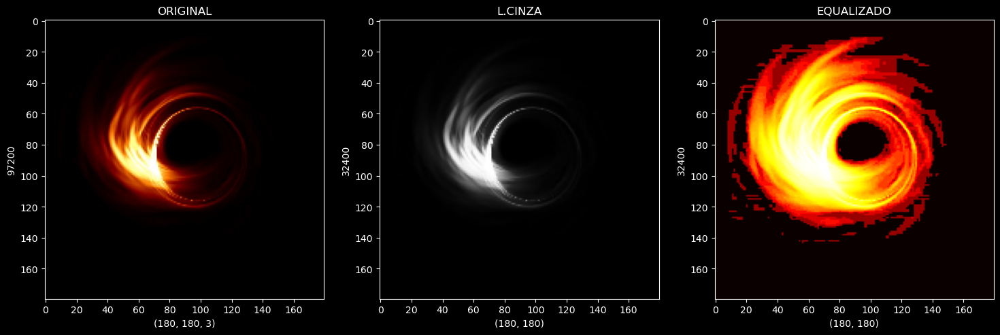

In [63]:
figure, axis = plt.subplots(1, 3, figsize=(18, 18))

indice_acrecao = acrecao_lista[1]
img_cinza = cv2.cvtColor(indice_acrecao, cv2.COLOR_RGB2GRAY)

# Equaliza o histogramaa da imagem em escala de cinza
Equalize_IMG = cv2.equalizeHist(img_cinza)

axis[0].set_xlabel(indice_acrecao.shape)
axis[0].set_ylabel(indice_acrecao.size)
axis[0].set_title("ORIGINAL")
axis[0].imshow(indice_acrecao, cmap="gray")

axis[1].set_xlabel(img_cinza.shape)
axis[1].set_ylabel(img_cinza.size)
axis[1].set_title("L.CINZA")
axis[1].imshow(img_cinza, cmap="gray")

axis[2].set_xlabel(Equalize_IMG.shape)
axis[2].set_ylabel(Equalize_IMG.size)
axis[2].set_title("EQUALIZADO")
axis[2].imshow(Equalize_IMG, cmap="hot")

plt.show()

Nesse trecho, o nosso objetivo visualizar os histogramas de cores de três imagens diferentes selecionadas da lista `acrecao_lista`. Ele calcula e plota os histogramas de cada canal de cor (vermelho, verde e azul) para cada uma das imagens, permitindo a comparação das distribuições de cores entre elas.

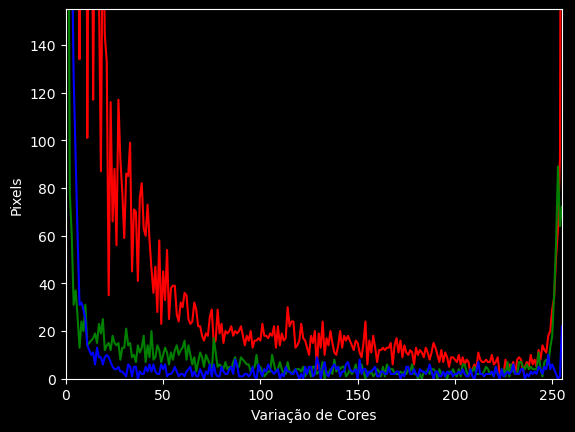

In [64]:
img_selecionada = acrecao_lista[1]

# Define as cores e os índices dos canais de cor (vermelho, verde, azul)
lista_cores = ("red", "green", "blue")
tamanho_canal = (0, 1, 2)

# Define os limites do gráfico
plt.xlim([0, 255])
plt.ylim([0, 155])

# Loop sobre os canais de cor
for id_canal, c in zip(tamanho_canal, lista_cores):
    # Calcula o histograma para o canal de cor atual
    histogram, bordas = np.histogram(
        img_selecionada[:, :, id_canal], bins=256, range=(0, 256))
    # Plota o histogram
    plt.plot(bordas[0:-1], histogram, color=c)

# Adiciona rótulos aos eixos x e y
plt.xlabel("Variação de Cores")
plt.ylabel("Pixels")
plt.show()

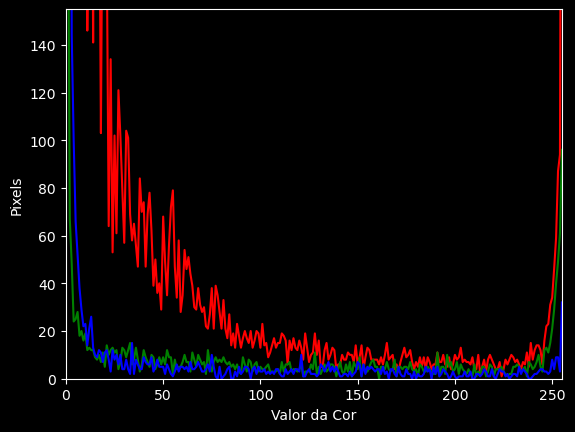

In [65]:
img_selecionada = acrecao_lista[100]

lista_cores = ("red", "green", "blue")
tamanho_canal = (0, 1, 2)

plt.xlim([0, 255])
plt.ylim([0, 155])

for id_canal, cor in zip(tamanho_canal, lista_cores):
    histograma, bordas = np.histogram(
        img_selecionada[:, :, id_canal], bins=256, range=(0, 256))
    plt.plot(bordas[0:-1], histograma, color=cor)

plt.xlabel("Valor da Cor")
plt.ylabel("Pixels")
plt.show()

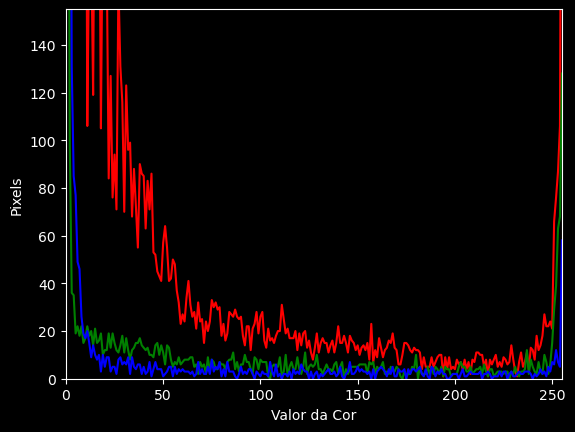

In [66]:
img_selecionada = acrecao_lista[433]

colors = ("red", "green", "blue")
tamanho_canal = (0, 1, 2)

plt.xlim([0, 255])
plt.ylim([0, 155])

for id_canal, c in zip(tamanho_canal, colors):
    histograma, bordas = np.histogram(
        img_selecionada[:, :, id_canal], bins=256, range=(0, 256))
    plt.plot(bordas[0:-1], histograma, color=c)

plt.xlabel("Valor da Cor")
plt.ylabel("Pixels")
plt.show()

Nós plotamos histogramas de cores para diferentes canais de cor (vermelho, verde e azul) de imagens selecionadas e cada imagem selecionada é convertida em um histograma que representa a distribuição da intensidade das cores ao longo do canal de cor específico.

Cada histograma mostra a quantidade de pixels em relação à intensidade de cor, onde o eixo x representa os valores de intensidade de cor (de 0 a 255) e o eixo y representa o número de pixels com essa intensidade de cor. Esses histogramas ajudam a visualizar como as intensidades de cores estão distribuídas em cada canal de cor das imagens selecionadas. A configuração dos limites do gráfico (`plt.xlim` e `plt.ylim`) controla o intervalo dos valores ao longo dos eixos x e y, respectivamente.

### 7.0 TÉCNICA CLAHE

CLAHE (Contrast Limited Adaptive Histogram Equalization) é uma técnica de processamento de imagens utilizada para melhorar o contraste local em uma imagem. É uma extensão da Equalização de Histograma (HE), mas com a vantagem de limitar o aumento do contraste em regiões de alta variação de intensidade, evitando assim a amplificação do ruído.

O CLAHE divide a imagem em pequenas regiões chamadas "tiles" e calcula o histograma de cada uma dessas regiões. Em seguida, ele aplica a equalização de histograma apenas para essas regiões, mas com um limite definido para evitar o aumento excessivo do contraste. Isso ajuda a evitar a amplificação do ruído em regiões homogêneas da imagem, mantendo ao mesmo tempo o aumento do contraste nas áreas de interesse.

Essa técnica é especialmente útil em imagens médicas e de sensoriamento remoto, onde o contraste local pode ser crucial para a detecção de características importantes.

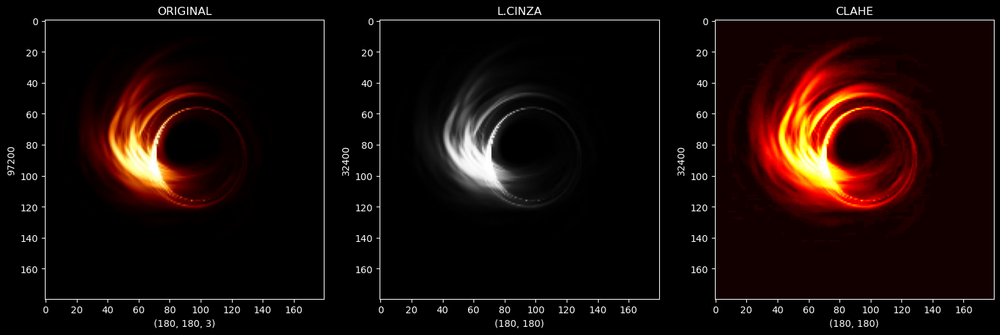

In [67]:
indice_acrecao = acrecao_lista[1]
img_cinza = cv2.cvtColor(indice_acrecao, cv2.COLOR_RGB2GRAY)

# Cria um objeto CLAHE (Contrast Limited Adaptive Histogram Equalization)
clahe = cv2.createCLAHE(clipLimit=5.0, tileGridSize=(8,8))

# Aplica o CLAHE à imagem em tons de cinza
util_clahe = clahe.apply(img_cinza)

# Cria uma figura com três subplots
figure, axis = plt.subplots(1, 3, figsize=(18,18))

axis[0].set_xlabel(indice_acrecao.shape)
axis[0].set_ylabel(indice_acrecao.size)
axis[0].set_title("ORIGINAL")
axis[0].imshow(indice_acrecao, cmap="gray")

axis[1].set_xlabel(img_cinza.shape)
axis[1].set_ylabel(img_cinza.size)
axis[1].set_title("L.CINZA")
axis[1].imshow(img_cinza, cmap="gray")

axis[2].set_xlabel(util_clahe.shape)
axis[2].set_ylabel(util_clahe.size)
axis[2].set_title("CLAHE")
axis[2].imshow(util_clahe, cmap="hot")
plt.show()

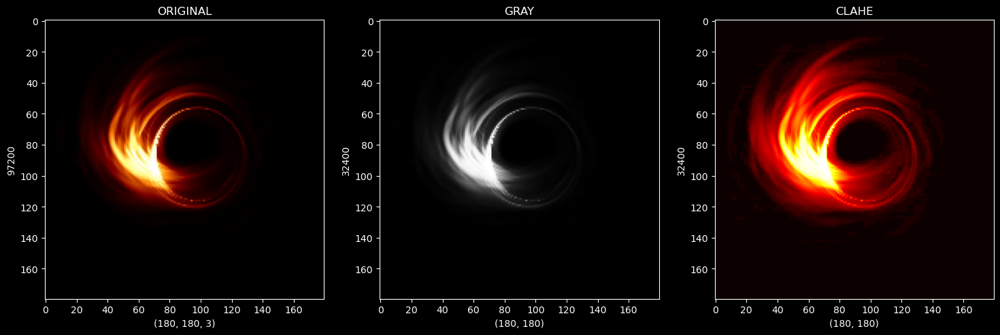

In [68]:
figure, axis = plt.subplots(1, 3, figsize=(18,18))
indice_acrecao = acrecao_lista[1]
img_cinza = cv2.cvtColor(indice_acrecao, cv2.COLOR_RGB2GRAY)
clahe = cv2.createCLAHE(clipLimit=5.0, tileGridSize=(2,2))
util_clahe = clahe.apply(img_cinza)

axis[0].set_xlabel(indice_acrecao.shape)
axis[0].set_ylabel(indice_acrecao.size)
axis[0].set_title("ORIGINAL")
axis[0].imshow(indice_acrecao, cmap="gray")

axis[1].set_xlabel(img_cinza.shape)
axis[1].set_ylabel(img_cinza.size)
axis[1].set_title("GRAY")
axis[1].imshow(img_cinza, cmap="gray")

axis[2].set_xlabel(util_clahe.shape)
axis[2].set_ylabel(util_clahe.size)
axis[2].set_title("CLAHE")
axis[2].imshow(util_clahe, cmap="hot")
plt.show()

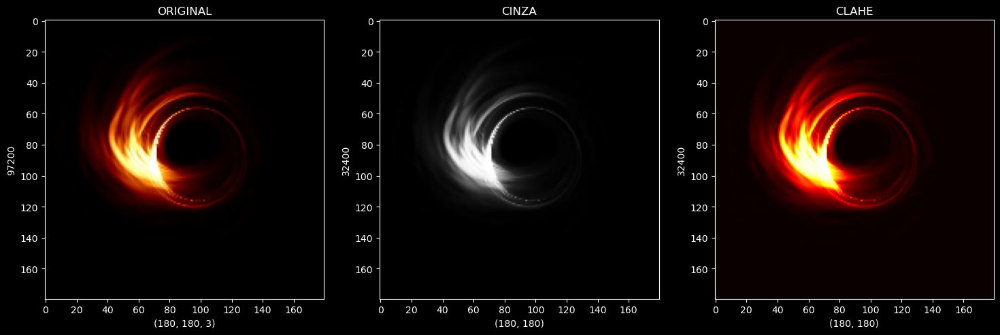

In [69]:
figure, axis = plt.subplots(1, 3, figsize=(18, 18))
indice_acrecao = acrecao_lista[1]
img_cinza = cv2.cvtColor(indice_acrecao, cv2.COLOR_RGB2GRAY)
clahe = cv2.createCLAHE(clipLimit=1.0, tileGridSize=(2, 2))
util_clahe = clahe.apply(img_cinza)

axis[0].set_xlabel(indice_acrecao.shape)
axis[0].set_ylabel(indice_acrecao.size)
axis[0].set_title("ORIGINAL")
axis[0].imshow(indice_acrecao, cmap="gray")

axis[1].set_xlabel(img_cinza.shape)
axis[1].set_ylabel(img_cinza.size)
axis[1].set_title("CINZA")
axis[1].imshow(img_cinza, cmap="gray")

axis[2].set_xlabel(util_clahe.shape)
axis[2].set_ylabel(util_clahe.size)
axis[2].set_title("CLAHE")
axis[2].imshow(util_clahe, cmap="hot")
plt.show()

Os três últimos códigos têm como objetivo principal a aplicação de técnicas de equalização de histograma em imagens para melhorar o contraste e a qualidade visual. 

No primeiro código, é utilizada a função `cv2.equalizeHist()` para equalizar o histograma da imagem em escala de cinza. A imagem original, a versão em escala de cinza e a imagem após a equalização são exibidas.

Nos dois últimos códigos, é empregado o método CLAHE (Contrast Limited Adaptive Histogram Equalization), que é uma variação da equalização de histograma com capacidade de limitação de contraste e adaptação local. Ambos os códigos exibem a imagem original, a versão em escala de cinza e a imagem após a aplicação do CLAHE, com variação nos parâmetros utilizados para demonstrar diferentes efeitos.

Os plots podem parecer idênticos nos três últimos códigos porque, apesar de diferentes técnicas de equalização de histograma estarem sendo aplicadas, os parâmetros utilizados podem não ser suficientemente distintos para gerar diferenças visíveis nos resultados. 

Além disso, se as imagens de entrada forem muito semelhantes ou se não houver variação significativa nos histogramas originais, as diferenças após a equalização podem ser sutis e dificilmente perceptíveis. 

Para tornar as diferenças mais evidentes, é possível ajustar os parâmetros de equalização ou escolher imagens com características mais diversas, o que pode resultar em variações mais significativas nos histogramas equalizados.

### 8.0 CONTORNOS E POLÍGONOS

Os contornos e polígonos têm significados específicos quando aplicados ao contexto dos buracos negros:

1. **Contornos:**
   - Nos buracos negros, os contornos podem representar fronteiras ou limites de regiões de interesse, como o horizonte de eventos (também conhecido como horizonte de Schwarzschild) ou áreas de alta densidade de matéria em torno do buraco negro.
   - Ao detectar e visualizar contornos em simulações ou observações de buracos negros, os cientistas podem identificar áreas significativas, como regiões de acreção ou estruturas de jatos relativísticos.
   - Além disso, a detecção de contornos pode ajudar a mapear a morfologia e a geometria das estruturas em torno do buraco negro, fornecendo insights sobre a dinâmica e a evolução desses objetos.

2. **Polígonos:**
   - A aproximação de contornos por polígonos (poligonização) é uma técnica comum para simplificar formas complexas. No contexto dos buracos negros, isso pode significar simplificar fronteiras ou estruturas observadas em simulações ou dados observacionais.
   - A simplificação de contornos por polígonos pode ajudar na análise e interpretação de dados, fornecendo uma representação mais clara e computacionalmente eficiente das características dos buracos negros e seus arredores.
   - Essa simplificação também pode ser útil para extrair características importantes dos dados, como a forma e a orientação do horizonte de eventos ou a distribuição espacial de matéria em torno do buraco negro.

Realizamos a detecção e visualização de contornos em imagens. Isso é útil para diversas aplicações de processamento de imagem, como reconhecimento de objetos, detecção de bordas e segmentação de objetos. O código seleciona uma imagem, converte-a para escala de cinza, aplica um limiar para destacar áreas de interesse, encontra e simplifica os contornos, desenha-os na imagem original e exibe as etapas do processo em uma única figura para comparação.

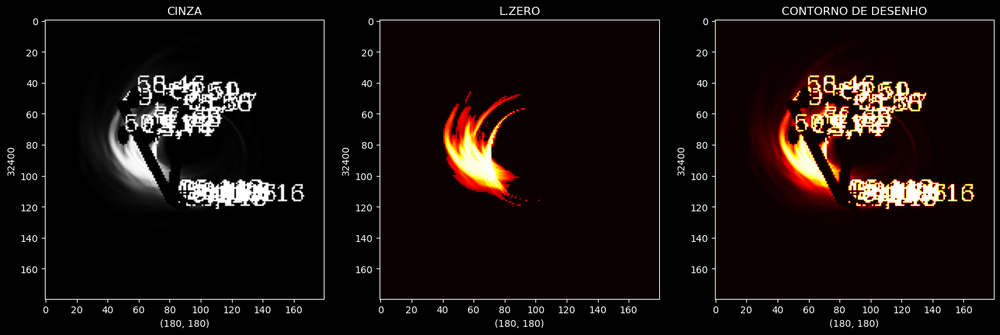

In [70]:
# Carrega uma imagem da lista de imagens
indice_acrecao = acrecao_lista[1]

# Converte a imagem para escala de cinza
img_cinza = cv2.cvtColor(indice_acrecao, cv2.COLOR_RGB2GRAY)

# Aplica um limiar para obter as áreas onde os pixels são maiores que 55
_, limiar_zero = cv2.threshold(img_cinza, 55, 255, cv2.THRESH_TOZERO)

# Encontra os contornos na imagem limiar_zero usando o algoritmo RETR_TREE
# e aproxima esses contornos para simplificar a forma
Contours, _ = cv2.findContours(limiar_zero, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

# Itera sobre cada contorno encontrado
for cnt in Contours:
    # Aproxima o contorno para uma forma mais simples
    approx = cv2.approxPolyDP(cnt, 0.09 * cv2.arcLength(cnt, True), True)
    
    # Desenha os contornos aproximados na imagem original
    contorno_desenho = cv2.drawContours(img_cinza, [approx], 0, (0, 255, 0), 5)
    
    # Itera sobre os pontos do contorno aproximado
    n_count = approx.ravel()
    i = 0
    for j in n_count:
        if (i % 2 == 0):
            x = n_count[i]
            y = n_count[i + 1]
            
            # Adiciona as coordenadas como texto nos pontos do contorno
            if (i == 0):
                cv2.putText(img_cinza, f"{x},{y}", (x, y), cv2.FONT_HERSHEY_COMPLEX, 0.5, (255, 0, 255))
            else:
                cv2.putText(img_cinza, "+", (x, y), cv2.FONT_HERSHEY_COMPLEX, 0.5, (0, 0, 255))
                
        i = i + 1

# Cria uma figura com 1 linha e 3 colunas para exibir as imagens
figure, axis = plt.subplots(1, 3, figsize=(18, 18))

# ========== PLOT ==========
axis[0].set_xlabel(img_cinza.shape)
axis[0].set_ylabel(img_cinza.size)
axis[0].set_title("CINZA")
axis[0].imshow(img_cinza, cmap="gray")

axis[1].set_xlabel(limiar_zero.shape)
axis[1].set_ylabel(limiar_zero.size)
axis[1].set_title("L.ZERO")
axis[1].imshow(limiar_zero, cmap="hot")

axis[2].set_xlabel(contorno_desenho.shape)
axis[2].set_ylabel(contorno_desenho.size)
axis[2].set_title("CONTORNO DE DESENHO")
axis[2].imshow(contorno_desenho, cmap="hot")  
plt.show()

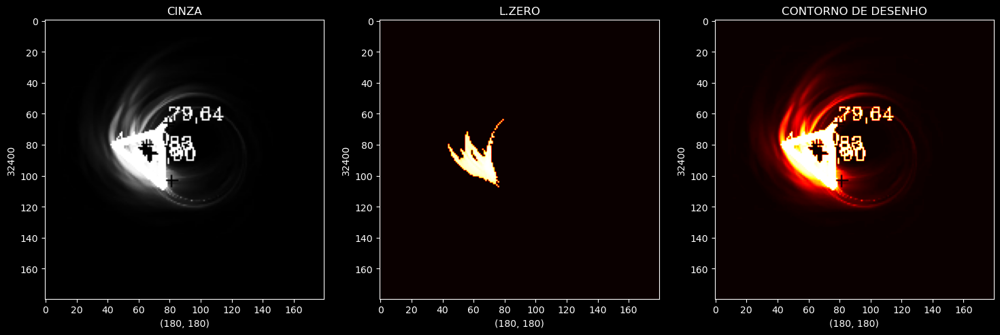

In [71]:
indice_acrecao = acrecao_lista[1]
img_cinza = cv2.cvtColor(indice_acrecao, cv2.COLOR_RGB2GRAY)
_, limiar_zero = cv2.threshold(img_cinza, 220, 255, cv2.THRESH_TOZERO)

Contours, _ = cv2.findContours(limiar_zero, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)


for cnt in Contours:
    approx = cv2.approxPolyDP(cnt, 0.09 * cv2.arcLength(cnt, True), True)
    contorno_desenho = cv2.drawContours(img_cinza, [approx], 0, (255, 255, 0), 3)
    n_count = approx.ravel()
    i = 0
    for j in n_count:
        if (i % 2 == 0):
            x = n_count[i]
            y = n_count[i + 1]
            
            if (i == 0):
                cv2.putText(img_cinza, f"{x},{y}", (x, y), cv2.FONT_HERSHEY_COMPLEX, 0.4, (255, 0, 255))
            else:
                cv2.putText(img_cinza, "+", (x, y), cv2.FONT_HERSHEY_COMPLEX, 0.4, (0, 0, 255))
                
        i = i + 1

figure, axis = plt.subplots(1, 3, figsize=(18, 18))

axis[0].set_xlabel(img_cinza.shape)
axis[0].set_ylabel(img_cinza.size)
axis[0].set_title("CINZA")
axis[0].imshow(img_cinza, cmap="gray")

axis[1].set_xlabel(limiar_zero.shape)
axis[1].set_ylabel(limiar_zero.size)
axis[1].set_title("L.ZERO")
axis[1].imshow(limiar_zero, cmap="hot")

axis[2].set_xlabel(contorno_desenho.shape)
axis[2].set_ylabel(contorno_desenho.size)
axis[2].set_title("CONTORNO DE DESENHO")
axis[2].imshow(contorno_desenho, cmap="hot")
plt.show()

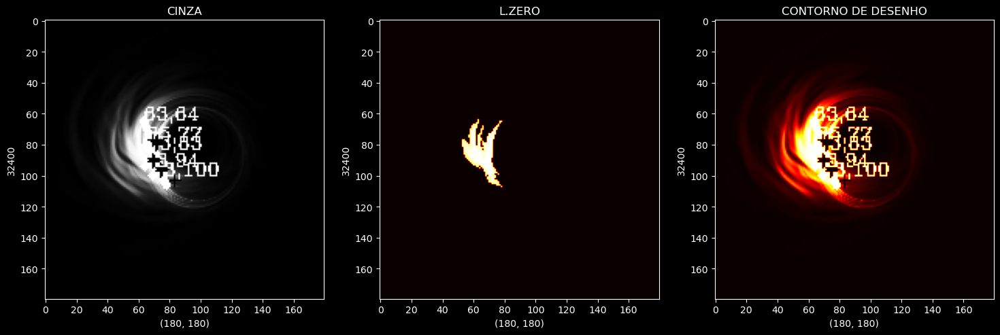

In [73]:
# Seleciona uma imagem da lista de imagens
indice_acrecao = acrecao_lista[400]
img_cinza = cv2.cvtColor(indice_acrecao, cv2.COLOR_RGB2GRAY)
_, limiar_zero = cv2.threshold(img_cinza, 220, 255, cv2.THRESH_TOZERO)

# Encontra os contornos na imagem limiar_zero usando o algoritmo RETR_TREE
# e aproxima esses contornos para simplificar a forma
Contours, _ = cv2.findContours(limiar_zero, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

for cnt in Contours:

    approx = cv2.approxPolyDP(cnt, 0.09 * cv2.arcLength(cnt, True), True)
    contorno_desenho = cv2.drawContours(img_cinza, [approx], 0, (255, 255, 0), 3)
    n_count = approx.ravel()
    i = 0
    for j in n_count:
        if (i % 2 == 0):
            x = n_count[i]
            y = n_count[i + 1]
            
            if (i == 0):
                cv2.putText(img_cinza, f"{x},{y}", (x, y), cv2.FONT_HERSHEY_COMPLEX, 0.4, (255, 0, 255))
            else:
                cv2.putText(img_cinza, "+", (x, y), cv2.FONT_HERSHEY_COMPLEX, 0.4, (0, 0, 255))
                
        i = i + 1

figure, axis = plt.subplots(1, 3, figsize=(18, 18))

axis[0].set_xlabel(img_cinza.shape)
axis[0].set_ylabel(img_cinza.size)
axis[0].set_title("CINZA")
axis[0].imshow(img_cinza, cmap="gray")

axis[1].set_xlabel(limiar_zero.shape)
axis[1].set_ylabel(limiar_zero.size)
axis[1].set_title("L.ZERO")
axis[1].imshow(limiar_zero, cmap="hot")

axis[2].set_xlabel(contorno_desenho.shape)
axis[2].set_ylabel(contorno_desenho.size)
axis[2].set_title("CONTORNO DE DESENHO")
axis[2].imshow(contorno_desenho, cmap="hot")
plt.show()

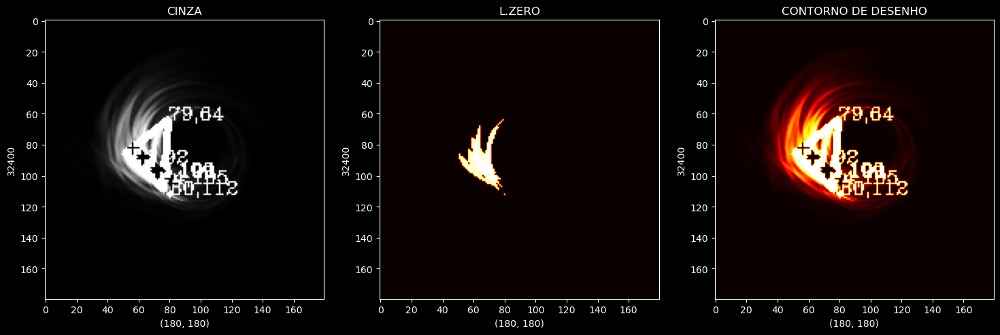

In [74]:
# Seleciona uma imagem da lista de imagens
indice_acrecao = acrecao_lista[277]
img_cinza = cv2.cvtColor(indice_acrecao, cv2.COLOR_RGB2GRAY)
_, limiar_zero = cv2.threshold(img_cinza, 220, 255, cv2.THRESH_TOZERO)
Contours, _ = cv2.findContours(limiar_zero, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)


for cnt in Contours:
    approx = cv2.approxPolyDP(cnt, 0.09 * cv2.arcLength(cnt, True), True)
    contorno_desenho = cv2.drawContours(img_cinza, [approx], 0, (255, 255, 0), 3)
    
    n_count = approx.ravel()
    i = 0
    for j in n_count:
        if (i % 2 == 0):
            x = n_count[i]
            y = n_count[i + 1]
            
            if (i == 0):
                cv2.putText(img_cinza, f"{x},{y}", (x, y), cv2.FONT_HERSHEY_COMPLEX, 0.4, (255, 0, 255))
            else:
                cv2.putText(img_cinza, "+", (x, y), cv2.FONT_HERSHEY_COMPLEX, 0.4, (0, 0, 255))
                
        i = i + 1


figure, axis = plt.subplots(1, 3, figsize=(18, 18))

axis[0].set_xlabel(img_cinza.shape)
axis[0].set_ylabel(img_cinza.size)
axis[0].set_title("CINZA")
axis[0].imshow(img_cinza, cmap="gray")

axis[1].set_xlabel(limiar_zero.shape)
axis[1].set_ylabel(limiar_zero.size)
axis[1].set_title("L.ZERO")
axis[1].imshow(limiar_zero, cmap="hot")

axis[2].set_xlabel(contorno_desenho.shape)
axis[2].set_ylabel(contorno_desenho.size)
axis[2].set_title("CONTORNO DE DESENHO")
axis[2].imshow(contorno_desenho, cmap="hot")
plt.show()

Os plots mostram diferentes estágios do processo de detecção e visualização de contornos em imagens:

1. No primeiro conjunto de plots, a imagem em escala de cinza é exibida, seguida pela imagem limiarizada (L.ZERO) e pelo desenho dos contornos na imagem original.

2. No segundo conjunto de plots, os valores de limiarização são diferentes, resultando em uma imagem limiarizada diferente (L.ZERO) e, consequentemente, em diferentes contornos desenhados na imagem original.

3. No terceiro conjunto de plots, uma imagem diferente é selecionada da lista, resultando em contornos distintos, embora o processo de detecção e visualização seja o mesmo.

4. No quarto conjunto de plots, outra imagem é selecionada, levando a contornos diferentes na imagem original.

Em resumo, destacamos as diferenças entre os plots residem principalmente nas imagens de entrada e nos valores de limiarização aplicados, o que afeta diretamente os contornos resultantes na imagem original.

### 9.0 VISÃO GERAL E PROCESSO APROXIMADOS

Aqui queremos detectar e visualizar de contornos em imagens, o que pode ser útil para identificar características relevantes, como bordas de objetos ou estruturas, dentro das imagens de interesse. A detecção de contornos é uma etapa importante em muitas aplicações de processamento de imagem, incluindo análise de imagens astronômicas, como as imagens de buracos negros. 

In [75]:
indice_acrecao = acrecao_lista[277]

# Converte a imagem para escala de cinza
img_cinza = cv2.cvtColor(indice_acrecao, cv2.COLOR_RGB2GRAY)

# Aplica um limiar na imagem para transformar em uma imagem binária
_, limiar_zero = cv2.threshold(img_cinza, 220, 255, cv2.THRESH_TOZERO)

# Encontra os contornos na imagem binarizada.
Contours, _ = cv2.findContours(limiar_zero, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

for cnt in Contours:
    approx = cv2.approxPolyDP(cnt, 0.09 * cv2.arcLength(cnt, True), True)
    contorno_desenho = cv2.drawContours(img_cinza, [approx], 0, (255, 255, 0), 3)
    n_count = approx.ravel()
    i = 0
    

    for j in n_count:
        if (i % 2 == 0):
            # Obtém as coordenadas x e y
            x = n_count[i]
            y = n_count[i + 1]
            
            # Cria uma string com as coordenadas x e y
            string_coor = str(x) + " " + str(y)
            
        # Incrementa i para acessar a próxima coordenada
        i += 1

# ===== IMPRIMINDO OS VALORES
print('Array Unidimensional')
# Imprime o array unidimensional de coordenadas
print(n_count)
print('--'*5)
# Imprime o shape do array unidimensional de coordenadas
print('Shape:')
print(n_count.shape)
# Separador
print("==========="*5)

# Reshape (redimensiona) o array unidimensional de coordenadas para ter 4 linhas e 2 colunas
array_redimensionado = n_count.reshape(4,2)

print('Array Redimensionado')
# Imprime o array redimensionado
print(array_redimensionado)
print('--'*5)
# Imprime o shape do array redimensionado
print('Shape:')
print(array_redimensionado.shape)

Array Unidimensional
[56 92 57 91 58 92 57 93]
----------
Shape:
(8,)
Array Redimensionado
[[56 92]
 [57 91]
 [58 92]
 [57 93]]
----------
Shape:
(4, 2)


### 10 TRANSFORMAÇÃO DE COORDENADAS

A partir daqui o objetivo de medir a distância entre o ponto de singularidade e os braços espirais em imagens relacionadas a buracos negros é entender a estrutura e a dinâmica desses sistemas astrofísicos complexos. Isso inclui estudar a formação e evolução dos buracos negros, mapear a distribuição de matéria ao redor deles, investigar a dinâmica dos braços espirais, identificar estruturas relacionadas como discos de acreção e jatos relativísticos, e construir modelos teóricos e simulações para melhor compreensão e previsão de observações futuras. 

Essas medições são fundamentais para avançar nosso conhecimento sobre a física dos buracos negros e seu papel na evolução galáctica.

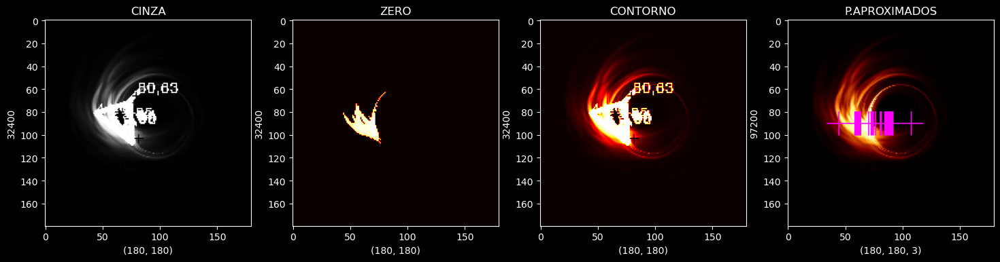

In [76]:
# Cria uma figura com 1 linha e 4 colunas para exibir as imagens
figure, axis = plt.subplots(1, 4, figsize=(18, 18))

indice_acrecao = acrecao_lista[2]
img_cinza = cv2.cvtColor(indice_acrecao, cv2.COLOR_RGB2GRAY)
_, limiar_zero = cv2.threshold(img_cinza, 220, 255, cv2.THRESH_TOZERO)
Contours, _ = cv2.findContours(limiar_zero, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

# Cria uma cópia da imagem original para marcação dos pontos aproximados
copia_img = indice_acrecao.copy()

# Cria uma matriz de zeros para marcação dos pontos aproximados
matriz_zerada = np.zeros((copia_img.shape[0], copia_img.shape[1]), dtype=np.float32)

# Lista para armazenar todos os pontos aproximados
pontos_aprox = []

for cnt in Contours:
    approx = cv2.approxPolyDP(cnt, 0.09 * cv2.arcLength(cnt, True), True)
    contorno_desenho = cv2.drawContours(img_cinza, [approx], 0, (255, 255, 0), 3)
    
    n_count = approx.ravel()
    i = 0
    for x_cor in n_count:
        x_cor = int(x_cor)
        # Marca os pontos aproximados na imagem original com um marcador magenta verticalmente centralizado
        Marker_IMG = cv2.drawMarker(copia_img, (x_cor, int(copia_img.shape[1] / 2)), (255, 0, 255), thickness=1)
    
    # Adiciona os pontos aproximados à lista pontos_aprox
    pontos_aprox.append(n_count)
    
    # Itera sobre os pontos do contorno aproximado
    for j in n_count:
        if (i % 2 == 0):
            x = n_count[i]
            y = n_count[i + 1]
            string_coor = str(x) + " " + str(y)
            if (i == 0):
                cv2.putText(img_cinza, f"{x},{y}", (x, y), cv2.FONT_HERSHEY_COMPLEX, 0.4, (255, 0, 255))
            else:
                cv2.putText(img_cinza, "+", (x, y), cv2.FONT_HERSHEY_COMPLEX, 0.4, (0, 0, 255))
        i += 1

# Imagem em escala de cinza
axis[0].set_xlabel(img_cinza.shape)
axis[0].set_ylabel(img_cinza.size)
axis[0].set_title("CINZA")
axis[0].imshow(img_cinza, cmap="gray")

# Limiar zero
axis[1].set_xlabel(limiar_zero.shape)
axis[1].set_ylabel(limiar_zero.size)
axis[1].set_title("ZERO")
axis[1].imshow(limiar_zero, cmap="hot")

# Limiar contornado
axis[2].set_xlabel(contorno_desenho.shape)
axis[2].set_ylabel(contorno_desenho.size)
axis[2].set_title("CONTORNO")
axis[2].imshow(contorno_desenho, cmap="hot") 

# Pontos aproximados
axis[3].set_xlabel(Marker_IMG.shape)
axis[3].set_ylabel(Marker_IMG.size)
axis[3].set_title("P.APROXIMADOS")
axis[3].imshow(Marker_IMG)
plt.show()

In [77]:
# Calcula o comprimento máximo entre todas as sublistas em pontos_aprox
tamanho_lista = max(len(sublist) for sublist in pontos_aprox)

# Preenche cada sublista em pontos_aprox com zeros para ter o mesmo comprimento máximo
padded_arrays = [np.pad(sublist, (0, tamanho_lista - len(sublist))) for sublist in pontos_aprox]

# Converte a lista de sublistas preenchidas em um array numpy bidimensional
lista_preenchida = np.array(padded_arrays)

# Imprime a forma do array numpy bidimensional resultante
print("TAMANHO TOTAL DO ARRAY: ", lista_preenchida.shape)

TAMANHO TOTAL DO ARRAY:  (6, 8)


[46 88 50 96]


[70 67 70 68 69 69 70 68]
[ 62  67  80 112]
[72 91 73 90 74 91 73 92]


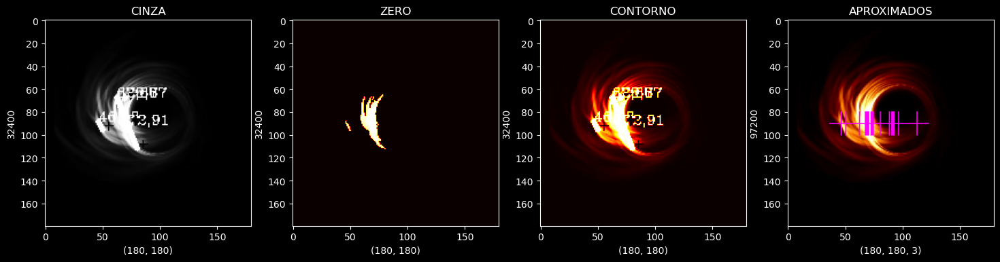

In [78]:
# Cria uma figura com uma linha e quatro colunas para exibir as imagens processadas
figure, axis = plt.subplots(1, 4, figsize=(18, 18))

# Seleciona uma imagem da lista de imagens de aeração
indice_acrecao = acrecao_lista[488]


img_cinza = cv2.cvtColor(indice_acrecao, cv2.COLOR_RGB2GRAY)
_, limiar_zero = cv2.threshold(img_cinza, 220, 255, cv2.THRESH_TOZERO)
Contours, _ = cv2.findContours(limiar_zero, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

copia_img = indice_acrecao.copy()
matriz_zerada = np.zeros((copia_img.shape[0], copia_img.shape[1]), dtype=np.float32)


for cnt in Contours:
    approx = cv2.approxPolyDP(cnt, 0.09 * cv2.arcLength(cnt, True), True)
    contorno_desenho = cv2.drawContours(img_cinza, [approx], 0, (255, 255, 0), 3)
    n_count = approx.ravel()
    i = 0
    
    for x_cor in n_count:
        # Converte as coordenadas x para int
        x_cor = int(x_cor)
        # Desenha um marcador na posição x, metade da altura da imagem
        Marker_IMG = cv2.drawMarker(copia_img, (x_cor, int(copia_img.shape[1] / 2)), (255, 0, 255), thickness=1)
    
    # Exibe as coordenadas do contorno aproximado
    print(n_count)
    
    # Itera sobre as coordenadas do contorno aproximado
    for j in n_count:
        # Verifica se j é um índice par (coordenada x)
        if (i % 2 == 0):
            # Obtém as coordenadas x e y
            x = n_count[i]
            y = n_count[i + 1]
            
            # Cria uma string com as coordenadas x e y
            string_coor = str(x) + " " + str(y)
            
            # Adiciona as coordenadas como texto na imagem em tons de cinza
            if (i == 0):
                cv2.putText(img_cinza, f"{x},{y}", (x, y), cv2.FONT_HERSHEY_COMPLEX, 0.4, (255, 0, 255))
            else:
                cv2.putText(img_cinza, "+", (x, y), cv2.FONT_HERSHEY_COMPLEX, 0.4, (0, 0, 255))
                
        # Incrementa i para acessar a próxima coordenada
        i = i + 1

axis[0].set_xlabel(img_cinza.shape)
axis[0].set_ylabel(img_cinza.size)
axis[0].set_title("CINZA")
axis[0].imshow(img_cinza, cmap="gray")

axis[1].set_xlabel(limiar_zero.shape)
axis[1].set_ylabel(limiar_zero.size)
axis[1].set_title("ZERO")
axis[1].imshow(limiar_zero, cmap="hot")

axis[2].set_xlabel(contorno_desenho.shape)
axis[2].set_ylabel(contorno_desenho.size)
axis[2].set_title("CONTORNO")
axis[2].imshow(contorno_desenho, cmap="hot") 

axis[3].set_xlabel(Marker_IMG.shape)
axis[3].set_ylabel(Marker_IMG.size)
axis[3].set_title("APROXIMADOS")
axis[3].imshow(Marker_IMG)
plt.show()

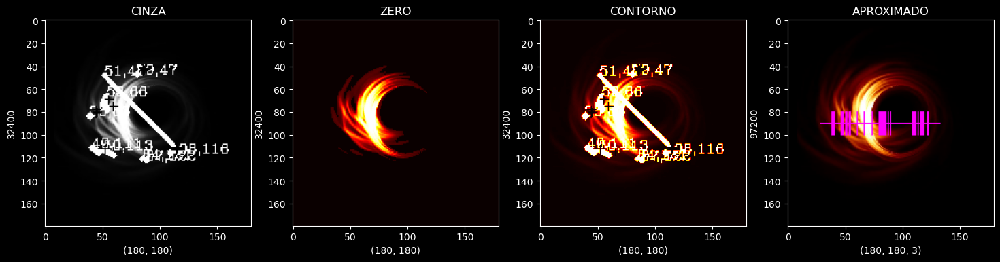

In [79]:
figure, axis = plt.subplots(1, 4, figsize=(18, 18))
indice_acrecao = acrecao_lista[510]
img_cinza = cv2.cvtColor(indice_acrecao, cv2.COLOR_RGB2GRAY)
_, limiar_zero = cv2.threshold(img_cinza, 20, 255, cv2.THRESH_TOZERO)
Contours, _ = cv2.findContours(limiar_zero, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

# Cria uma cópia
copia_img = indice_acrecao.copy()

# Matriz de zeros
matriz_zerada = np.zeros((copia_img.shape[0], copia_img.shape[1]), dtype=np.float32)


for cnt in Contours:
    # Aproxima o contorno por um fator de 0.09 da sua circunferência
    approx = cv2.approxPolyDP(cnt, 0.09 * cv2.arcLength(cnt, True), True)
    contorno_desenho = cv2.drawContours(img_cinza, [approx], 0, (255, 255, 0), 3)
    n_count = approx.ravel()
    i = 0
    
    for x_cor in n_count:
        x_cor = int(x_cor)
        Marker_IMG = cv2.drawMarker(copia_img, (x_cor, int(copia_img.shape[1] / 2)), (255, 0, 255), thickness=1)
    
    for j in n_count:
        if (i % 2 == 0):
            x = n_count[i]
            y = n_count[i + 1]
            
            string_coor = str(x) + " " + str(y)
            
            if (i == 0):
                cv2.putText(img_cinza, f"{x},{y}", (x, y), cv2.FONT_HERSHEY_COMPLEX, 0.4, (255, 0, 255))
            else:
                cv2.putText(img_cinza, "+", (x, y), cv2.FONT_HERSHEY_COMPLEX, 0.4, (0, 0, 255))
                
        i = i + 1

axis[0].set_xlabel(img_cinza.shape)
axis[0].set_ylabel(img_cinza.size)
axis[0].set_title("CINZA")
axis[0].imshow(img_cinza, cmap="gray")

axis[1].set_xlabel(limiar_zero.shape)
axis[1].set_ylabel(limiar_zero.size)
axis[1].set_title("ZERO")
axis[1].imshow(limiar_zero, cmap="hot")

axis[2].set_xlabel(contorno_desenho.shape)
axis[2].set_ylabel(contorno_desenho.size)
axis[2].set_title("CONTORNO")
axis[2].imshow(contorno_desenho, cmap="hot") 

axis[3].set_xlabel(Marker_IMG.shape)
axis[3].set_ylabel(Marker_IMG.size)
axis[3].set_title("APROXIMADO")
axis[3].imshow(Marker_IMG)
plt.show()

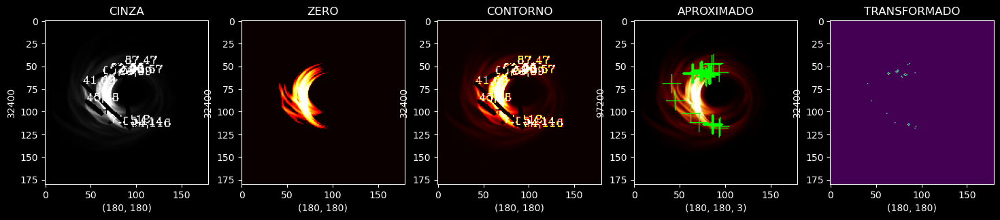

In [80]:
figure, axis = plt.subplots(1, 5, figsize=(18, 18))
indice_acrecao = acrecao_lista[510]
img_cinza = cv2.cvtColor(indice_acrecao, cv2.COLOR_RGB2GRAY)
_, limiar_zero = cv2.threshold(img_cinza, 55, 255, cv2.THRESH_TOZERO)
Contours, _ = cv2.findContours(limiar_zero, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
copia_img = indice_acrecao.copy()
matriz_zerada = np.zeros((copia_img.shape[0], copia_img.shape[1]), dtype=np.float32)

for cnt in Contours:
    approx = cv2.approxPolyDP(cnt, 0.09 * cv2.arcLength(cnt, True), True)
    contorno_desenho = cv2.drawContours(img_cinza, [approx], 0, (0, 255, 0), 3)
    n_count = approx.ravel()
    i = 0
    
    for j in n_count:
        if (i % 2 == 0):
            x = n_count[i]
            y = n_count[i + 1]
            
            Marker_IMG = cv2.drawMarker(copia_img, (int(x), int(y)), (0, 255, 0), thickness=1)
            matriz_zerada[int(y), int(x)] = 1
            
            if (i == 0):
                cv2.putText(img_cinza, f"{x},{y}", (x, y), cv2.FONT_HERSHEY_COMPLEX, 0.4, (255, 0, 255))
            else:
                cv2.putText(img_cinza, "+", (x, y), cv2.FONT_HERSHEY_COMPLEX, 0.4, (0, 0, 255))
                
        i = i + 1

axis[0].set_xlabel(img_cinza.shape)
axis[0].set_ylabel(img_cinza.size)
axis[0].set_title("CINZA")
axis[0].imshow(img_cinza, cmap="gray")

axis[1].set_xlabel(limiar_zero.shape)
axis[1].set_ylabel(limiar_zero.size)
axis[1].set_title("ZERO")
axis[1].imshow(limiar_zero, cmap="hot")

axis[2].set_xlabel(contorno_desenho.shape)
axis[2].set_ylabel(contorno_desenho.size)
axis[2].set_title("CONTORNO")
axis[2].imshow(contorno_desenho, cmap="hot") 

axis[3].set_xlabel(Marker_IMG.shape)
axis[3].set_ylabel(Marker_IMG.size)
axis[3].set_title("APROXIMADO")
axis[3].imshow(Marker_IMG)

axis[4].set_xlabel(matriz_zerada.shape)
axis[4].set_ylabel(matriz_zerada.size)
axis[4].set_title("TRANSFORMADO")
axis[4].imshow(matriz_zerada)

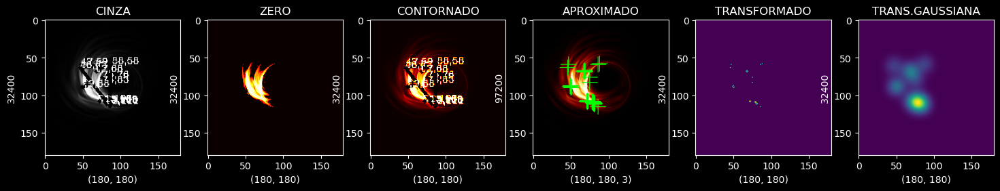

In [81]:
from scipy.ndimage import gaussian_filter  # Importa a função gaussian_filter do módulo scipy.ndimage

figure, axis = plt.subplots(1, 6, figsize=(18, 18))
indice_acrecao = acrecao_lista[55]
img_cinza = cv2.cvtColor(indice_acrecao, cv2.COLOR_RGB2GRAY)
_, limiar_zero = cv2.threshold(img_cinza, 90, 255, cv2.THRESH_TOZERO)
Contours, _ = cv2.findContours(limiar_zero, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
copia_img = indice_acrecao.copy()
matriz_zerada = np.zeros((copia_img.shape[0], copia_img.shape[1]), dtype=np.float32)

for cnt in Contours:
    approx = cv2.approxPolyDP(cnt, 0.09 * cv2.arcLength(cnt, True), True)
    contorno_desenho = cv2.drawContours(img_cinza, [approx], 0, (0, 255, 0), 3)

    n_count = approx.ravel()
    i = 0
    
    for j in n_count:
        if (i % 2 == 0):
            x = n_count[i]
            y = n_count[i + 1]
            
            Marker_IMG = cv2.drawMarker(copia_img, (int(x), int(y)), (0, 255, 0), thickness=1)
            matriz_zerada[int(y), int(x)] = 1
            
            if (i == 0):
                cv2.putText(img_cinza, f"{x},{y}", (x, y), cv2.FONT_HERSHEY_COMPLEX, 0.4, (255, 0, 255))
            else:
                cv2.putText(img_cinza, "+", (x, y), cv2.FONT_HERSHEY_COMPLEX, 0.4, (0, 0, 255))
                
        i = i + 1

gaussiana_img = gaussian_filter(matriz_zerada, sigma=8, truncate=6*6)

axis[0].set_xlabel(img_cinza.shape)
axis[0].set_ylabel(img_cinza.size)
axis[0].set_title("CINZA")
axis[0].imshow(img_cinza, cmap="gray")

axis[1].set_xlabel(limiar_zero.shape)
axis[1].set_ylabel(limiar_zero.size)
axis[1].set_title("ZERO")
axis[1].imshow(limiar_zero, cmap="hot")

axis[2].set_xlabel(contorno_desenho.shape)
axis[2].set_ylabel(contorno_desenho.size)
axis[2].set_title("CONTORNADO")
axis[2].imshow(contorno_desenho, cmap="hot") 

axis[3].set_xlabel(Marker_IMG.shape)
axis[3].set_ylabel(Marker_IMG.size)
axis[3].set_title("APROXIMADO")
axis[3].imshow(Marker_IMG)

axis[4].set_xlabel(matriz_zerada.shape)
axis[4].set_ylabel(matriz_zerada.size)
axis[4].set_title("TRANSFORMADO")
axis[4].imshow(matriz_zerada)

axis[5].set_xlabel(gaussiana_img.shape)
axis[5].set_ylabel(gaussiana_img.size)
axis[5].set_title("TRANS.GAUSSIANA")
axis[5].imshow(gaussiana_img)
plt.show()

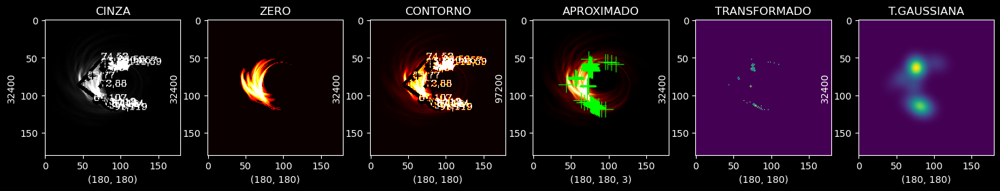

In [82]:
figure, axis = plt.subplots(1, 6, figsize=(18, 18))
indice_acrecao = acrecao_lista[100]
img_cinza = cv2.cvtColor(indice_acrecao, cv2.COLOR_RGB2GRAY)
_, limiar_zero = cv2.threshold(img_cinza, 55, 255, cv2.THRESH_TOZERO)
Contours, _ = cv2.findContours(limiar_zero, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
copia_img = indice_acrecao.copy()
matriz_zerada = np.zeros((copia_img.shape[0], copia_img.shape[1]), dtype=np.float32)

for cnt in Contours:
    approx = cv2.approxPolyDP(cnt, 0.09 * cv2.arcLength(cnt, True), True)
    contorno_desenho = cv2.drawContours(img_cinza, [approx], 0, (0, 255, 0), 3)
    n_count = approx.ravel()
    i = 0
    
    for j in n_count:
        if (i % 2 == 0):
            x = n_count[i]
            y = n_count[i + 1]
            
            Marker_IMG = cv2.drawMarker(copia_img, (int(x), int(y)), (0, 255, 0), thickness=1)
            matriz_zerada[int(y), int(x)] = 1

            if (i == 0):
                cv2.putText(img_cinza, f"{x},{y}", (x, y), cv2.FONT_HERSHEY_COMPLEX, 0.4, (255, 0, 255))
            else:
                cv2.putText(img_cinza, "+", (x, y), cv2.FONT_HERSHEY_COMPLEX, 0.4, (0, 0, 255))
                
        i = i + 1

gaussiana_img = gaussian_filter(matriz_zerada, sigma=8, truncate=4*4)

axis[0].set_xlabel(img_cinza.shape)
axis[0].set_ylabel(img_cinza.size)
axis[0].set_title("CINZA")
axis[0].imshow(img_cinza, cmap="gray")

axis[1].set_xlabel(limiar_zero.shape)
axis[1].set_ylabel(limiar_zero.size)
axis[1].set_title("ZERO")
axis[1].imshow(limiar_zero, cmap="hot")

axis[2].set_xlabel(contorno_desenho.shape)
axis[2].set_ylabel(contorno_desenho.size)
axis[2].set_title("CONTORNO")
axis[2].imshow(contorno_desenho, cmap="hot") 

axis[3].set_xlabel(Marker_IMG.shape)
axis[3].set_ylabel(Marker_IMG.size)
axis[3].set_title("APROXIMADO")
axis[3].imshow(Marker_IMG)

axis[4].set_xlabel(matriz_zerada.shape)
axis[4].set_ylabel(matriz_zerada.size)
axis[4].set_title("TRANSFORMADO")
axis[4].imshow(matriz_zerada)

axis[5].set_xlabel(gaussiana_img.shape)
axis[5].set_ylabel(gaussiana_img.size)
axis[5].set_title("T.GAUSSIANA")
axis[5].imshow(gaussiana_img)
plt.show()

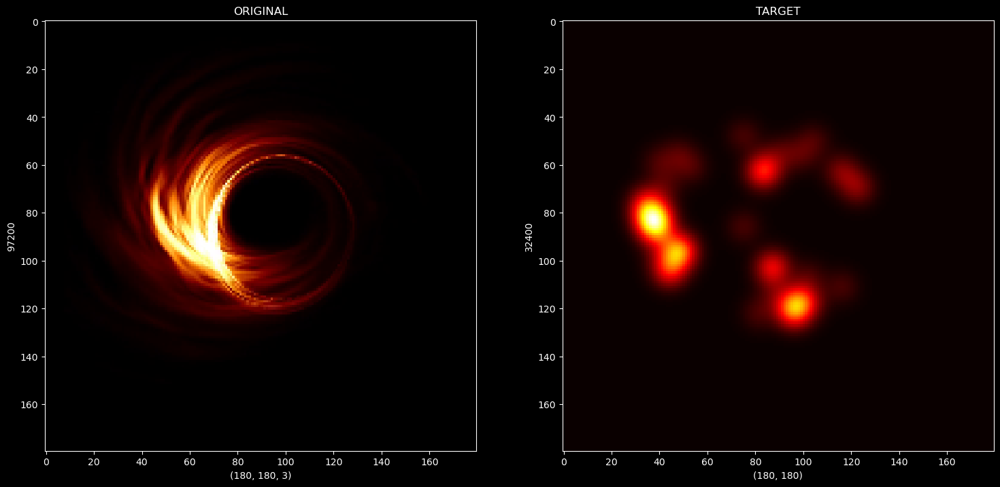

In [83]:
indice_acrecao = acrecao_lista[100]
img_cinza = cv2.cvtColor(indice_acrecao, cv2.COLOR_RGB2GRAY)
_, limiar_zero = cv2.threshold(img_cinza, 20, 255, cv2.THRESH_TOZERO)
Contours, _ = cv2.findContours(limiar_zero, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
copia_img = indice_acrecao.copy()
matriz_zerada = np.zeros((copia_img.shape[0], copia_img.shape[1]), dtype=np.float32)

for cnt in Contours:
    approx = cv2.approxPolyDP(cnt, 0.009 * cv2.arcLength(cnt, True), True)
    n_count = approx.ravel()
    i = 0
    
    for j in n_count:
        if (i % 2 == 0):  # Verifica se é um índice par (coordenada x)
            x = n_count[i]
            y = n_count[i + 1]
            
            # Marca os pontos na matriz zerada
            matriz_zerada[int(y), int(x)] = 1
        
        i = i + 1

gaussiana_img = gaussian_filter(matriz_zerada, sigma=5, truncate=4*4)

# Plota a imagem original e a imagem de destino (após aplicação do filtro gaussiano) lado a lado
figure, axis = plt.subplots(1, 2, figsize=(18, 18))

axis[0].set_xlabel(indice_acrecao.shape)
axis[0].set_ylabel(indice_acrecao.size)
axis[0].set_title("ORIGINAL")
axis[0].imshow(indice_acrecao)

axis[1].set_xlabel(gaussiana_img.shape)
axis[1].set_ylabel(gaussiana_img.size)
axis[1].set_title("TARGET")
axis[1].imshow(gaussiana_img, cmap="hot")
plt.show()

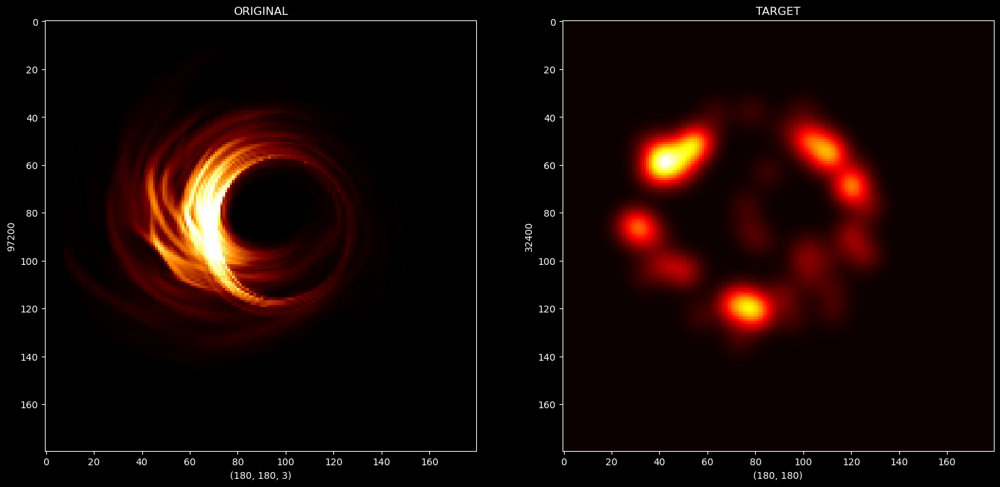

In [84]:
figure, axis = plt.subplots(1, 2, figsize=(18, 18))
indice_acrecao = acrecao_lista[500]
img_cinza = cv2.cvtColor(indice_acrecao, cv2.COLOR_RGB2GRAY)
_, limiar_zero = cv2.threshold(img_cinza, 10, 255, cv2.THRESH_TOZERO)
Contours, _ = cv2.findContours(limiar_zero, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
copia_img = indice_acrecao.copy()
matriz_zerada = np.zeros((copia_img.shape[0], copia_img.shape[1]), dtype=np.float32)

for cnt in Contours:
    approx = cv2.approxPolyDP(cnt, 0.009 * cv2.arcLength(cnt, True), True)    
    n_count = approx.ravel()
    i = 0
    
    for j in n_count:
        if (i % 2 == 0):  
            x = n_count[i]
            y = n_count[i + 1]
            
            matriz_zerada[int(y), int(x)] = 1
                
        i = i + 1
    
gaussiana_img = gaussian_filter(matriz_zerada, sigma=5, truncate=4*4)

axis[0].set_xlabel(indice_acrecao.shape)
axis[0].set_ylabel(indice_acrecao.size)
axis[0].set_title("ORIGINAL")
axis[0].imshow(indice_acrecao)

axis[1].set_xlabel(gaussiana_img.shape)
axis[1].set_ylabel(gaussiana_img.size)
axis[1].set_title("TARGET")
axis[1].imshow(gaussiana_img, cmap="hot")
plt.show()

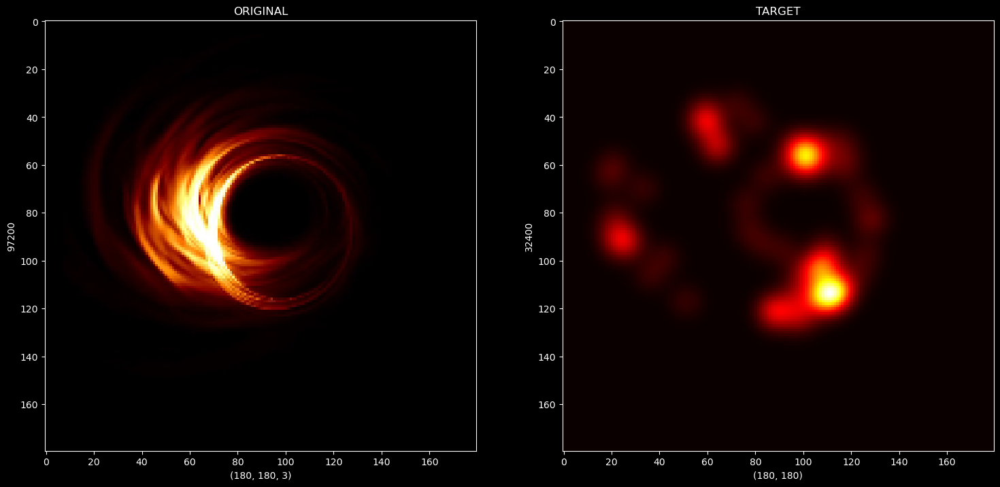

In [85]:
figure,axis = plt.subplots(1,2,figsize=(18,18))
indice_acrecao = acrecao_lista[387]
img_cinza = cv2.cvtColor(indice_acrecao,cv2.COLOR_RGB2GRAY)
_,limiar_zero = cv2.threshold(img_cinza,10,255,cv2.THRESH_TOZERO)
Contours,_ = cv2.findContours(limiar_zero,cv2.RETR_TREE,cv2.CHAIN_APPROX_SIMPLE)
copia_img = indice_acrecao.copy()
matriz_zerada = np.zeros((copia_img.shape[0],copia_img.shape[1]),dtype=np.float32)

for cnt in Contours:
    approx = cv2.approxPolyDP(cnt,0.009*cv2.arcLength(cnt,True),True)    
    n_count = approx.ravel()
    i = 0
    
    for j in n_count:
        if (i % 2 == 0):
            x = n_count[i]
            y = n_count[i + 1]
            
            string_coor = str(x) + " " + str(y)
            matriz_zerada[int(y),int(x)] = 1
                
        i = i + 1

gaussiana_img = gaussian_filter(matriz_zerada,sigma=5,truncate=4*4)

axis[0].set_xlabel(indice_acrecao.shape)
axis[0].set_ylabel(indice_acrecao.size)
axis[0].set_title("ORIGINAL")
axis[0].imshow(indice_acrecao)

axis[1].set_xlabel(gaussiana_img.shape)
axis[1].set_ylabel(gaussiana_img.size)
axis[1].set_title("TARGET")
axis[1].imshow(gaussiana_img,cmap="hot")
plt.show()

Com esse código realizamos a detecção de contornos em imagens de buracos negros, aproximando esses contornos para simplificá-los. Os pontos aproximados são marcados na imagem original para identificar características como os braços espirais. As imagens são então processadas em diferentes etapas, como escala de cinza e limiarização, para visualizar o progresso do processamento. 

A matriz de pontos é transformada e suavizada com um filtro gaussiano para reduzir o ruído. A comparação entre as imagens originais e as processadas permite a análise das mudanças e a avaliação da eficácia do processamento. Essas etapas são cruciais para entender as características das imagens relacionadas a buracos negros, especialmente os braços espirais, contribuindo para a pesquisa astronômica e a compreensão dos fenômenos envolvidos.

### 11. PONTOS-CHAVE COM COORDENADAS

Aqui indentificamos pontos e coordenadas referentes às localizações específicas dos pontos-chave detectados nas imagens de buracos negros. Esses pontos-chave são identificados usando algoritmos de detecção, como o algoritmo SIFT (Scale-Invariant Feature Transform). As coordenadas desses pontos são utilizadas para marcar e visualizar características importantes, como contornos e padrões, nas imagens processadas. Essa abordagem permite a análise detalhada das características dos braços espirais em torno dos buracos negros, contribuindo para a compreensão dos fenômenos astronômicos envolvidos.

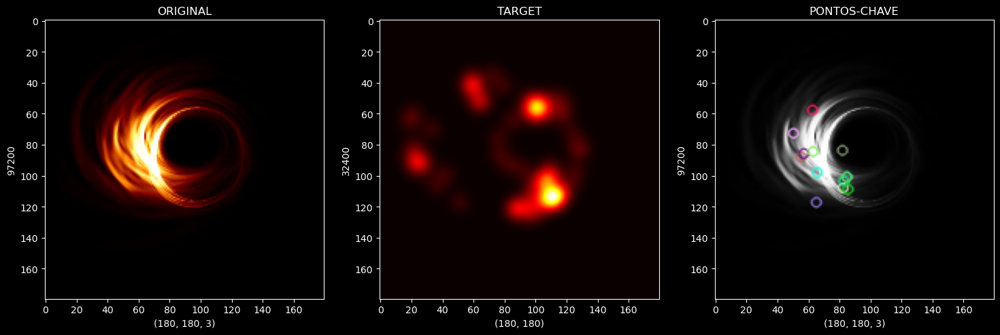

In [86]:
figure, axis = plt.subplots(1, 3, figsize=(18, 18))
indice_acrecao = acrecao_lista[387]
img_cinza = cv2.cvtColor(indice_acrecao, cv2.COLOR_RGB2GRAY)
_, limiar_zero = cv2.threshold(img_cinza, 10, 255, cv2.THRESH_TOZERO)
Contours, _ = cv2.findContours(limiar_zero, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
copia_img = indice_acrecao.copy()
matriz_zerada = np.zeros((copia_img.shape[0], copia_img.shape[1]), dtype=np.float32)

for cnt in Contours:
    approx = cv2.approxPolyDP(cnt, 0.009 * cv2.arcLength(cnt, True), True)    
    n_count = approx.ravel()
    i = 0
    
    for j in n_count:
        if (i % 2 == 0):  
            x = n_count[i]
            y = n_count[i + 1]
            
            matriz_zerada[int(y), int(x)] = 1
                
        i = i + 1
    
gaussiana_img = gaussian_filter(matriz_zerada, sigma=5, truncate=4*4)

# Cria um detector SIFT
sift_detector = cv2.SIFT_create()

# Detecta e calcula os descritores dos pontos-chave na imagem binarizada
keypoints, desc = sift_detector.detectAndCompute(limiar_zero, None)

# Desenha os pontos-chave na imagem original
pc_IMG = cv2.drawKeypoints(img_cinza, keypoints, img_cinza)

axis[0].set_xlabel(indice_acrecao.shape)
axis[0].set_ylabel(indice_acrecao.size)
axis[0].set_title("ORIGINAL")
axis[0].imshow(indice_acrecao)

axis[1].set_xlabel(gaussiana_img.shape)
axis[1].set_ylabel(gaussiana_img.size)
axis[1].set_title("TARGET")
axis[1].imshow(gaussiana_img, cmap="hot")

axis[2].set_xlabel(pc_IMG.shape)
axis[2].set_ylabel(pc_IMG.size)
axis[2].set_title("PONTOS-CHAVE")
axis[2].imshow(pc_IMG)
plt.show()

### 12. ESQUELETO COM ALVO

Decidimos gerar uma representação do "esqueleto" das imagens de buracos negros. O processo começa convertendo a imagem original para tons de cinza e aplicando um limiar para destacar as regiões de interesse. Em seguida, é detectado o contorno dessas regiões e aproximado para reduzir a complexidade. O "esqueleto" é obtido aplicando um filtro gaussiano à matriz resultante, seguido pela transformação em um esqueleto usando a função `skeletonize` do módulo `morphology` do pacote `scikit-image`. O esqueleto é uma representação simplificada das características principais da imagem, útil para análises posteriores. O código também inclui a exibição das imagens original, de destino (após o filtro gaussiano) e do esqueleto em um subplot de três colunas para comparação visual.

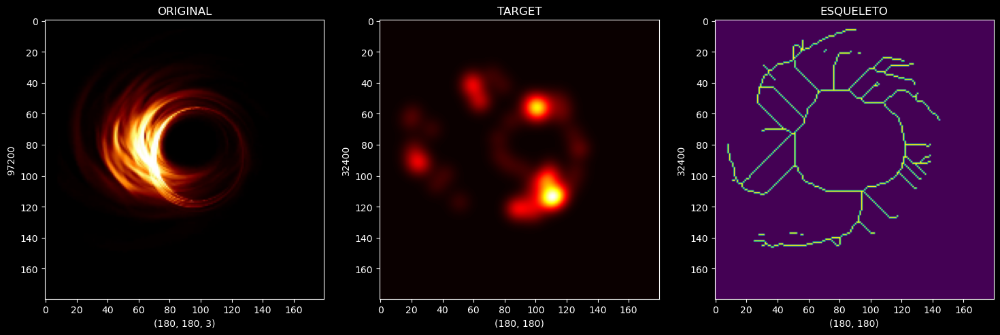

In [87]:
figure,axis = plt.subplots(1,3,figsize=(18,18))
indice_acrecao = acrecao_lista[387]
img_cinza = cv2.cvtColor(indice_acrecao,cv2.COLOR_RGB2GRAY)
_,limiar_zero = cv2.threshold(img_cinza,10,255,cv2.THRESH_TOZERO)
Contours,_ = cv2.findContours(limiar_zero,cv2.RETR_TREE,cv2.CHAIN_APPROX_SIMPLE)
copia_img = indice_acrecao.copy()
matriz_zerada = np.zeros((copia_img.shape[0],copia_img.shape[1]),dtype=np.float32)

for cnt in Contours:
    approx = cv2.approxPolyDP(cnt,0.009*cv2.arcLength(cnt,True),True)    
    n_count = approx.ravel()
    i = 0

    for j in n_count:
        if (i % 2 == 0):
            x = n_count[i]
            y = n_count[i + 1]
            
            string_coor = str(x) + " " + str(y)
            matriz_zerada[int(y),int(x)] = 1
                
        i = i + 1
    
gaussiana_img = gaussian_filter(matriz_zerada,sigma=5,truncate=4*4)
array_target = np.array(img_cinza > gaussiana_img).astype(int)
esqueleto_IMG = skimage.morphology.skeletonize(array_target)

axis[0].set_xlabel(indice_acrecao.shape)
axis[0].set_ylabel(indice_acrecao.size)
axis[0].set_title("ORIGINAL")
axis[0].imshow(indice_acrecao)

axis[1].set_xlabel(gaussiana_img.shape)
axis[1].set_ylabel(gaussiana_img.size)
axis[1].set_title("TARGET")
axis[1].imshow(gaussiana_img,cmap="hot")

axis[2].set_xlabel(esqueleto_IMG.shape)
axis[2].set_ylabel(esqueleto_IMG.size)
axis[2].set_title("ESQUELETO")
axis[2].imshow(esqueleto_IMG)
plt.show()

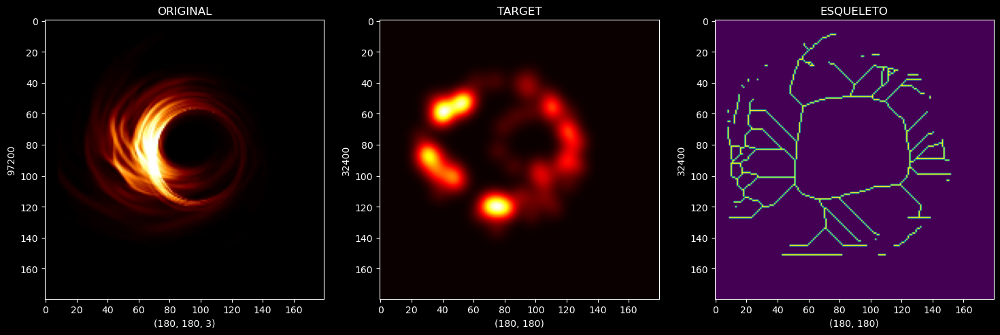

In [88]:
figure,axis = plt.subplots(1,3,figsize=(18,18))
indice_acrecao = acrecao_lista[501]
img_cinza = cv2.cvtColor(indice_acrecao,cv2.COLOR_RGB2GRAY)
_,limiar_zero = cv2.threshold(img_cinza,10,255,cv2.THRESH_TOZERO)
Contours,_ = cv2.findContours(limiar_zero,cv2.RETR_TREE,cv2.CHAIN_APPROX_SIMPLE)
copia_img = indice_acrecao.copy()
matriz_zerada = np.zeros((copia_img.shape[0],copia_img.shape[1]),dtype=np.float32)

for cnt in Contours:
    approx = cv2.approxPolyDP(cnt,0.009*cv2.arcLength(cnt,True),True)    
    n_count = approx.ravel()
    i = 0

    for j in n_count:
        if (i % 2 == 0):
            x = n_count[i]
            y = n_count[i + 1]
            
            string_coor = str(x) + " " + str(y)
            matriz_zerada[int(y),int(x)] = 1
                
        i = i + 1
    
gaussiana_img = gaussian_filter(matriz_zerada,sigma=5,truncate=4*4)
array_target = np.array(img_cinza > gaussiana_img).astype(int)
esqueleto_IMG = skimage.morphology.skeletonize(array_target)

axis[0].set_xlabel(indice_acrecao.shape)
axis[0].set_ylabel(indice_acrecao.size)
axis[0].set_title("ORIGINAL")
axis[0].imshow(indice_acrecao)

axis[1].set_xlabel(gaussiana_img.shape)
axis[1].set_ylabel(gaussiana_img.size)
axis[1].set_title("TARGET")
axis[1].imshow(gaussiana_img,cmap="hot")

axis[2].set_xlabel(esqueleto_IMG.shape)
axis[2].set_ylabel(esqueleto_IMG.size)
axis[2].set_title("ESQUELETO")
axis[2].imshow(esqueleto_IMG)
plt.show()

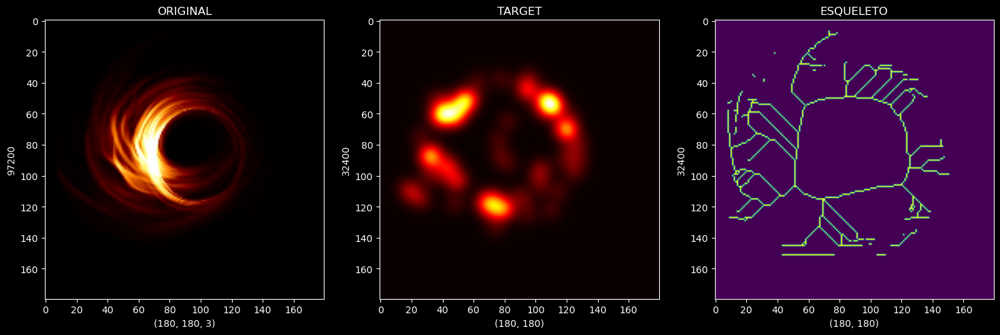

In [89]:
figure,axis = plt.subplots(1,3,figsize=(18,18))
indice_acrecao = acrecao_lista[499]
img_cinza = cv2.cvtColor(indice_acrecao,cv2.COLOR_RGB2GRAY)
_,limiar_zero = cv2.threshold(img_cinza,10,255,cv2.THRESH_TOZERO)
Contours,_ = cv2.findContours(limiar_zero,cv2.RETR_TREE,cv2.CHAIN_APPROX_SIMPLE)
copia_img = indice_acrecao.copy()
matriz_zerada = np.zeros((copia_img.shape[0],copia_img.shape[1]),dtype=np.float32)

for cnt in Contours:
    approx = cv2.approxPolyDP(cnt,0.009*cv2.arcLength(cnt,True),True)    
    n_count = approx.ravel()
    i = 0

    for j in n_count:
        if (i % 2 == 0):
            x = n_count[i]
            y = n_count[i + 1]
            
            string_coor = str(x) + " " + str(y)
            matriz_zerada[int(y),int(x)] = 1
                
        i = i + 1
    
gaussiana_img = gaussian_filter(matriz_zerada,sigma=5,truncate=4*4)
array_target = np.array(img_cinza > gaussiana_img).astype(int)
esqueleto_IMG = skimage.morphology.skeletonize(array_target)

axis[0].set_xlabel(indice_acrecao.shape)
axis[0].set_ylabel(indice_acrecao.size)
axis[0].set_title("ORIGINAL")
axis[0].imshow(indice_acrecao)

axis[1].set_xlabel(gaussiana_img.shape)
axis[1].set_ylabel(gaussiana_img.size)
axis[1].set_title("TARGET")
axis[1].imshow(gaussiana_img,cmap="hot")

axis[2].set_xlabel(esqueleto_IMG.shape)
axis[2].set_ylabel(esqueleto_IMG.size)
axis[2].set_title("ESQUELETO")
axis[2].imshow(esqueleto_IMG)
plt.show()

### 13. ESPECTRO HESSIANO COM ALVO

Aqui fizemos a análide do espectro Hessiano das imagens de buracos negros. Começa convertendo a imagem original para tons de cinza e aplicando um limiar para destacar as regiões de interesse. Em seguida, é calculado o espectro Hessiano dessas regiões, que é uma matriz que contém informações sobre a curvatura da imagem em cada ponto. 

Essa matriz é decomposta em seus autovalores, que representam a magnitude da curvatura em duas direções ortogonais. As imagens resultantes dos autovalores máximos e mínimos são exibidas para visualização. O objetivo dessa análise é identificar características importantes nas imagens relacionadas a buracos negros, como bordas ou regiões de alta curvatura. O código inclui a exibição das imagens original, de destino (após o filtro gaussiano) e dos espectros Hessiano máximo e mínimo em um subplot de quatro colunas para comparação visual.

**O ESPECTRO HESSIANO:** <br>

O espectro Hessiano é uma técnica de processamento de imagens que analisa a curvatura local em cada ponto da imagem. Ele é útil para detectar bordas e regiões de mudanças abruptas na imagem. Isso é feito calculando os autovalores da matriz Hessiana em cada ponto, o que fornece informações sobre a direção e magnitude da curvatura. Em essência, o espectro Hessiano ajuda a identificar características importantes nas imagens, como bordas e detalhes relevantes.

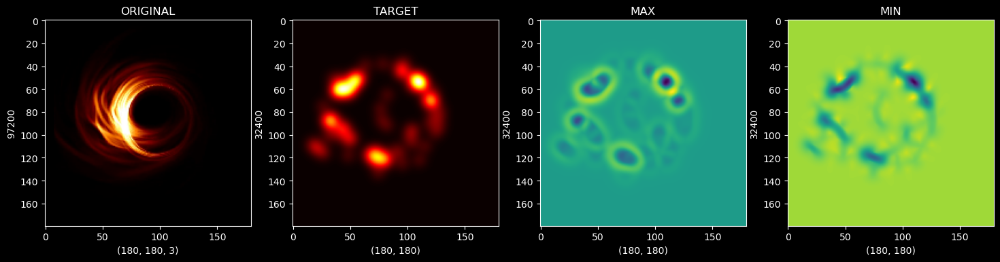

In [90]:
figure,axis = plt.subplots(1,4,figsize=(18,18))
indice_acrecao = acrecao_lista[499]
img_cinza = cv2.cvtColor(indice_acrecao,cv2.COLOR_RGB2GRAY)
_,limiar_zero = cv2.threshold(img_cinza,10,255,cv2.THRESH_TOZERO)
Contours,_ = cv2.findContours(limiar_zero,cv2.RETR_TREE,cv2.CHAIN_APPROX_SIMPLE)
copia_img = indice_acrecao.copy()
matriz_zerada = np.zeros((copia_img.shape[0],copia_img.shape[1]),dtype=np.float32)

for cnt in Contours:
    approx = cv2.approxPolyDP(cnt,0.009*cv2.arcLength(cnt,True),True)    
    n_count = approx.ravel()
    i = 0

    for j in n_count:
        if (i % 2 == 0):
            x = n_count[i]
            y = n_count[i + 1]
            
            string_coor = str(x) + " " + str(y)
            matriz_zerada[int(y),int(x)] = 1
                
        i = i + 1
    
gaussiana_img = gaussian_filter(matriz_zerada,sigma=5,truncate=4*4)
hessiano_IMG = hessian_matrix(gaussiana_img,sigma=0.5,order="rc")
max_IMG,min_IMG = hessian_matrix_eigvals(hessiano_IMG)

axis[0].set_xlabel(indice_acrecao.shape)
axis[0].set_ylabel(indice_acrecao.size)
axis[0].set_title("ORIGINAL")
axis[0].imshow(indice_acrecao)

axis[1].set_xlabel(gaussiana_img.shape)
axis[1].set_ylabel(gaussiana_img.size)
axis[1].set_title("TARGET")
axis[1].imshow(gaussiana_img,cmap="hot")

axis[2].set_xlabel(max_IMG.shape)
axis[2].set_ylabel(max_IMG.size)
axis[2].set_title("MAX")
axis[2].imshow(max_IMG)

axis[3].set_xlabel(min_IMG.shape)
axis[3].set_ylabel(min_IMG.size)
axis[3].set_title("MIN")
axis[3].imshow(min_IMG)
plt.show()

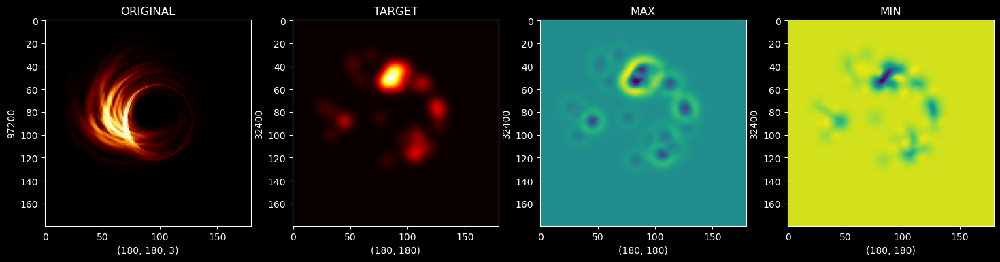

In [91]:
figure,axis = plt.subplots(1,4,figsize=(18,18))
indice_acrecao = acrecao_lista[34]
img_cinza = cv2.cvtColor(indice_acrecao,cv2.COLOR_RGB2GRAY)
_,limiar_zero = cv2.threshold(img_cinza,10,255,cv2.THRESH_TOZERO)
Contours,_ = cv2.findContours(limiar_zero,cv2.RETR_TREE,cv2.CHAIN_APPROX_SIMPLE)
copia_img = indice_acrecao.copy()
matriz_zerada = np.zeros((copia_img.shape[0],copia_img.shape[1]),dtype=np.float32)

for cnt in Contours:
    approx = cv2.approxPolyDP(cnt,0.009*cv2.arcLength(cnt,True),True)    
    n_count = approx.ravel()
    i = 0

    for j in n_count:
        if (i % 2 == 0):
            x = n_count[i]
            y = n_count[i + 1]
            
            string_coor = str(x) + " " + str(y)
            matriz_zerada[int(y),int(x)] = 1
                
        i = i + 1
    
gaussiana_img = gaussian_filter(matriz_zerada,sigma=5,truncate=4*4)
hessiano_IMG = hessian_matrix(gaussiana_img,sigma=0.5,order="rc")
max_IMG,min_IMG = hessian_matrix_eigvals(hessiano_IMG)

axis[0].set_xlabel(indice_acrecao.shape)
axis[0].set_ylabel(indice_acrecao.size)
axis[0].set_title("ORIGINAL")
axis[0].imshow(indice_acrecao)

axis[1].set_xlabel(gaussiana_img.shape)
axis[1].set_ylabel(gaussiana_img.size)
axis[1].set_title("TARGET")
axis[1].imshow(gaussiana_img,cmap="hot")

axis[2].set_xlabel(max_IMG.shape)
axis[2].set_ylabel(max_IMG.size)
axis[2].set_title("MAX")
axis[2].imshow(max_IMG)

axis[3].set_xlabel(min_IMG.shape)
axis[3].set_ylabel(min_IMG.size)
axis[3].set_title("MIN")
axis[3].imshow(min_IMG)
plt.show()

### 14. VISÃO GERAL E PROCESSO APROXIMADOS

Nessa parte do código realizamos a detecção de contornos em uma imagem específica (índice_acrecao), convertemos a imagem para escala de cinza e aplicamos um limiar para destacar áreas de interesse. Em seguida, são encontrados os contornos na imagem limiarizada e aproximados para reduzir sua complexidade. 

Os contornos aproximados são desenhados na imagem original para fins de visualização. Posteriormente, são extraídas as coordenadas dos contornos e são apresentadas de maneira organizada, tanto em um formato unidimensional quanto redimensionado para facilitar sua interpretação. Essa etapa é fundamental para a detecção de contornos em imagens que podem conter buracos negros ou características relacionadas a eles. A detecção de contornos permite identificar e delinear regiões de interesse na imagem, como possíveis estruturas de disco de acreção, jatos ou outras características associadas aos buracos negros. 

In [92]:
indice_acrecao = acrecao_lista[277]
img_cinza = cv2.cvtColor(indice_acrecao, cv2.COLOR_RGB2GRAY)
_, limiar_zero = cv2.threshold(img_cinza, 220, 255, cv2.THRESH_TOZERO)
Contours, _ = cv2.findContours(limiar_zero, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

for cnt in Contours:
    approx = cv2.approxPolyDP(cnt, 0.09 * cv2.arcLength(cnt, True), True)
    contorno_desenho = cv2.drawContours(img_cinza, [approx], 0, (255, 255, 0), 3)
    
    n_count = approx.ravel()
    i = 0
    
    for j in n_count:
        if (i % 2 == 0):  
            x = n_count[i]
            y = n_count[i + 1]
            string_coor = str(x) + " " + str(y)
        
        i = i + 1

In [93]:
# ===== IMPRIMINDO OS VALORES
print('Array Unidimensional')
# Imprime o array unidimensional de coordenadas
print(n_count)
print('--'*5)
# Imprime o shape do array unidimensional de coordenadas
print('Shape:')
print(n_count.shape)
# Separador
print("==========="*5)

# Reshape (redimensiona) o array unidimensional de coordenadas para ter 4 linhas e 2 colunas
array_redimensionado = n_count.reshape(4,2)
print('Array Redimensionado')
# Imprime o array redimensionado
print(array_redimensionado)
print('--'*5)
# Imprime o shape do array redimensionado
print('Shape:')
print(array_redimensionado.shape)

Array Unidimensional
[56 92 57 91 58 92 57 93]
----------
Shape:
(8,)
Array Redimensionado
[[56 92]
 [57 91]
 [58 92]
 [57 93]]
----------
Shape:
(4, 2)


### 15. PROCESSAMENTO DOS DADOS

O código em questão faz parte de um projeto relacionado à análise de imagens de buracos negros. Seu objetivo é processar imagens relacionadas a buracos negros, realizando operações como conversão para escala de cinza, aplicação de limiares, identificação de contornos e suavização por filtro gaussiano. Além disso, o código cria listas para armazenar as imagens originais e processadas, permitindo a comparação visual entre elas. Essas operações são fundamentais para compreender e analisar as características das imagens de buracos negros, contribuindo para avanços na área da astrofísica.

A comparação entre a imagem original e o alvo (target) é essencial para avaliar o processo de transformação realizado nas imagens de buracos negros. A imagem original representa a entrada inicial, geralmente uma imagem bruta capturada por telescópios ou outros dispositivos de observação. Já o alvo (target) é o resultado após a aplicação de diversas etapas de processamento, como conversão para escala de cinza, aplicação de limiares, detecção de contornos e suavização

In [97]:
# Cria lista vazias para inserção de dados
lista_original = []
lista_target = []

for image_x in acrecao_lista:
    img_cinza = cv2.cvtColor(image_x, cv2.COLOR_RGB2GRAY)
    _, limiar_zero = cv2.threshold(img_cinza, 10, 255, cv2.THRESH_TOZERO)
    Contours, _ = cv2.findContours(limiar_zero, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    matriz_zerada = np.zeros((image_x.shape[0], image_x.shape[1]), dtype=np.float32)

    for cnt in Contours:
        approx = cv2.approxPolyDP(cnt, 0.009 * cv2.arcLength(cnt, True), True)    
        n_count = approx.ravel()
        i = 0

        for j in n_count:
            if (i % 2 == 0):  
                x = n_count[i]
                y = n_count[i + 1]
                matriz_zerada[int(y), int(x)] = 1

            i = i + 1

    gaussiana_img = gaussian_filter(matriz_zerada, sigma=5, truncate=4*4)
    # Insere os dados nas respectivas listas
    lista_original.append(image_x)
    lista_target.append(gaussiana_img)

# Imprime as formas das listas de imagens originais e transformadas
print("Array em formato original: ", np.shape(np.array(lista_original)))
print("Array transformada: ", np.shape(np.array(lista_target)))

Array em formato original:  (513, 180, 180, 3)
Array transformada:  (513, 180, 180)


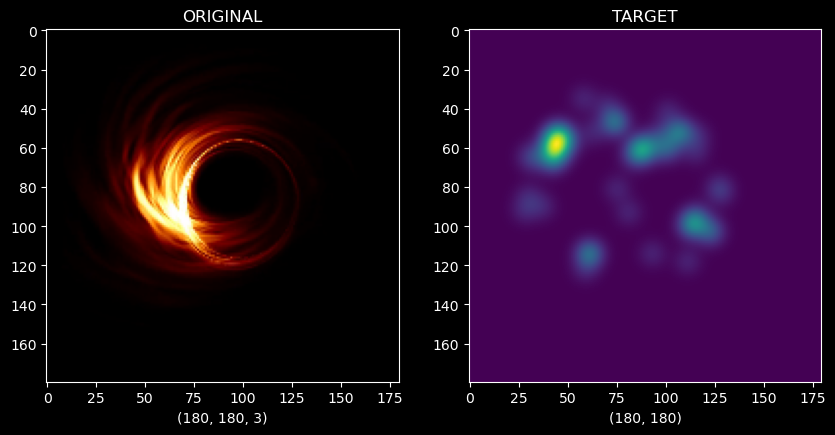

In [98]:
# Cria uma figura e um conjunto de eixos com uma linha e duas colunas, especificando o tamanho da figura
figure, axis = plt.subplots(1, 2, figsize=(10, 10))

# Plota a primeira imagem na primeira coluna dos eixos
axis[0].imshow(lista_original[100])

# Define o label do eixo x como a forma da primeira imagem
axis[0].set_xlabel(lista_original[100].shape)

# Define o título da primeira imagem
axis[0].set_title("ORIGINAL")

# Plota a segunda imagem na segunda coluna dos eixos
axis[1].imshow(lista_target[100])

# Define o label do eixo x como a forma da segunda imagem
axis[1].set_xlabel(lista_target[100].shape)

# Define o título da segunda imagem
axis[1].set_title("TARGET")
plt.show()

Text(0.5, 1.0, 'TARGET')

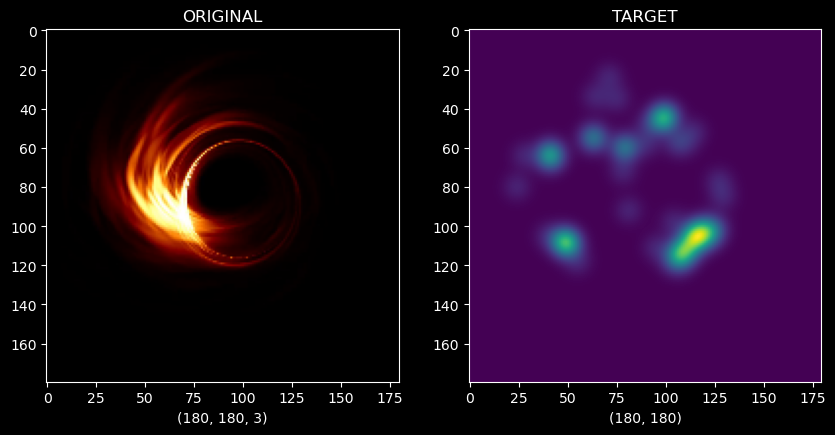

In [99]:
figure,axis = plt.subplots(1,2,figsize=(10,10))
axis[0].imshow(lista_original[1])
axis[0].set_xlabel(lista_original[1].shape)
axis[0].set_title("ORIGINAL")
axis[1].imshow(lista_target[1])
axis[1].set_xlabel(lista_target[1].shape)
axis[1].set_title("TARGET")

Text(0.5, 1.0, 'TARGET')

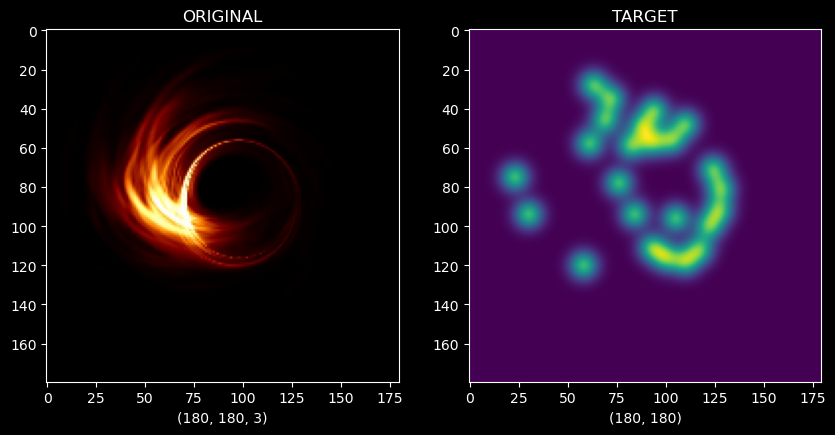

In [100]:
figure,axis = plt.subplots(1,2,figsize=(10,10))
axis[0].imshow(lista_original[10])
axis[0].set_xlabel(lista_original[10].shape)
axis[0].set_title("ORIGINAL")
axis[1].imshow(lista_target[10])
axis[1].set_xlabel(lista_target[10].shape)
axis[1].set_title("TARGET")

Text(0.5, 1.0, 'TARGET')

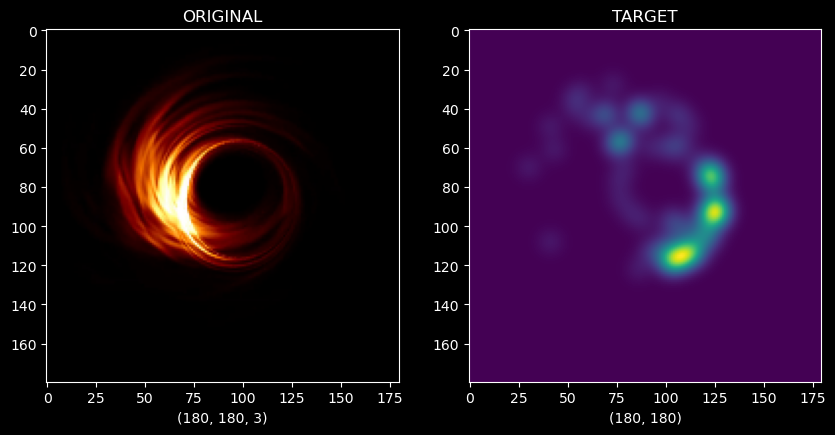

In [101]:
figure,axis = plt.subplots(1,2,figsize=(10,10))
axis[0].imshow(lista_original[300])
axis[0].set_xlabel(lista_original[300].shape)
axis[0].set_title("ORIGINAL")
axis[1].imshow(lista_target[300])
axis[1].set_xlabel(lista_target[300].shape)
axis[1].set_title("TARGET")

(-0.5, 179.5, 179.5, -0.5)

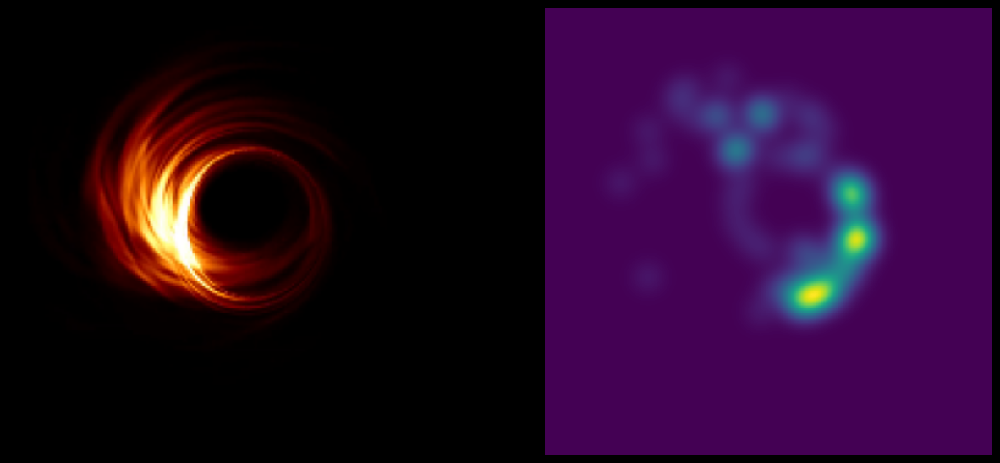

In [102]:
# Cria uma figura e um conjunto de eixos com uma linha e duas colunas, especificando o tamanho da figura
figure, axis = plt.subplots(1, 2, figsize=(15, 15))

# Define o número da imagem a ser exibida
tamanho_IMG = 300 

# Plota a primeira imagem na primeira coluna dos eixos
axis[0].imshow(lista_original[tamanho_IMG])

# Desativa a exibição dos eixos para a primeira imagem
axis[0].axis("off")

# Plota a segunda imagem na segunda coluna dos eixos
axis[1].imshow(lista_target[tamanho_IMG])

# Desativa a exibição dos eixos para a segunda imagem
axis[1].axis("off")

# Salva a figura como um arquivo PNG com o nome formatado com o número da imagem (descomentar)
# plt.savefig(f"IMG{tamanho_IMG}.png")

(-0.5, 179.5, 179.5, -0.5)

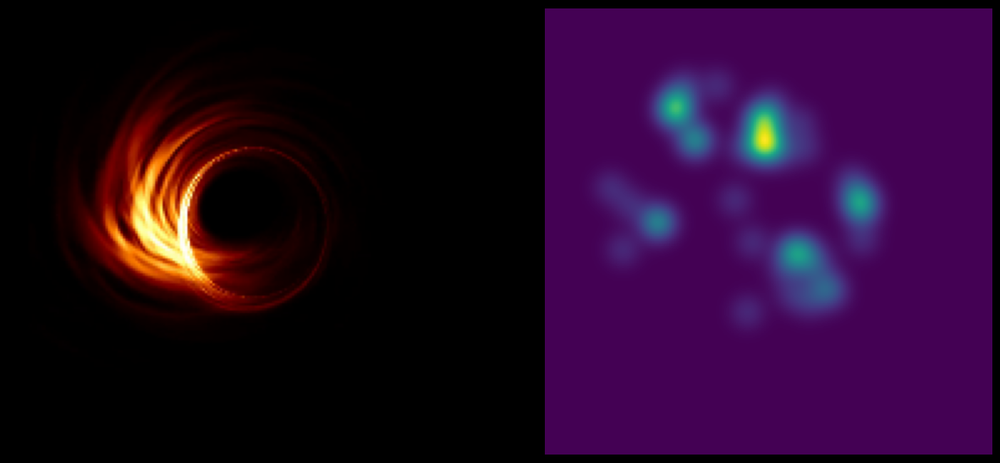

In [103]:
figure,axis = plt.subplots(1,2,figsize=(15,15))
tamanho_IMG = 30 
axis[0].imshow(lista_original[tamanho_IMG])
axis[0].axis("off")
axis[1].imshow(lista_target[tamanho_IMG])
axis[1].axis("off")
# plt.savefig(f"IMG{tamanho_IMG}.png")

(-0.5, 179.5, 179.5, -0.5)

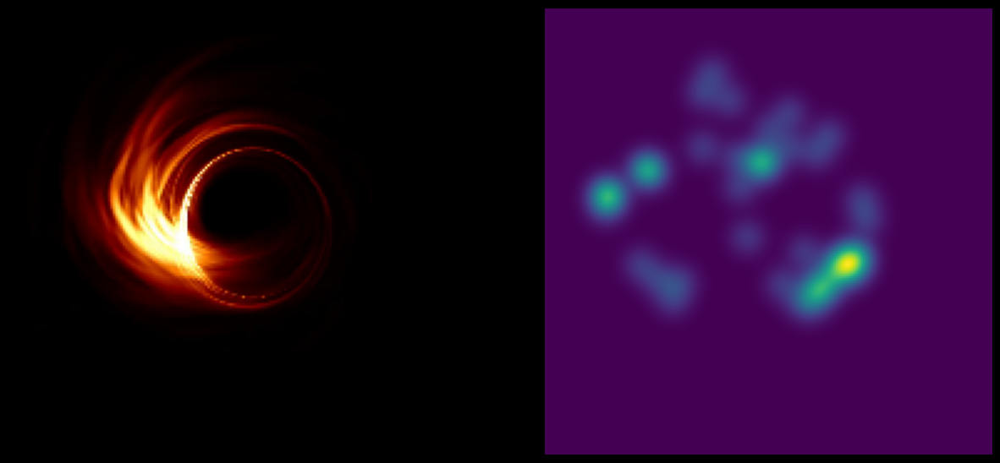

In [104]:
figure, axis = plt.subplots(1, 2, figsize=(15, 15))
# Define o número da imagem a ser exibida
tamanho_IMG = 3 
axis[0].imshow(lista_original[tamanho_IMG])
axis[0].axis("off")
axis[1].imshow(lista_target[tamanho_IMG])
axis[1].axis("off")
# plt.savefig(f"IMG{tamanho_IMG}.png")

(-0.5, 179.5, 179.5, -0.5)

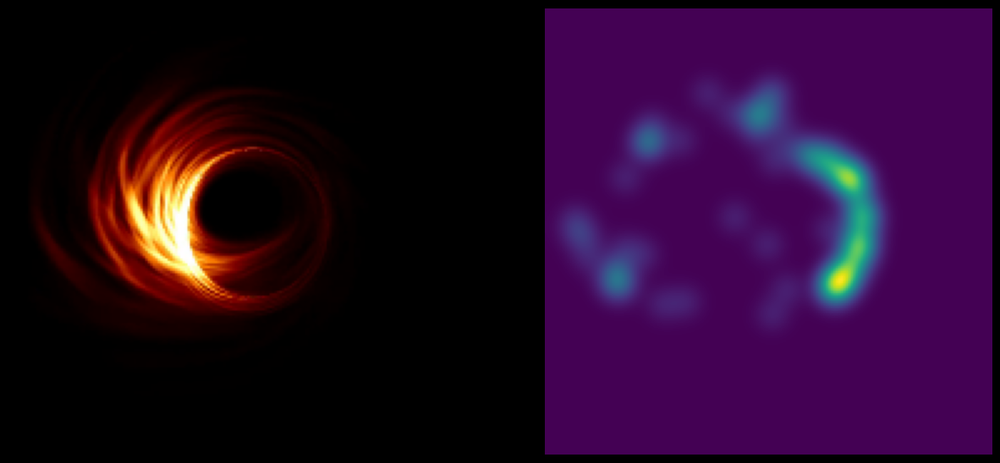

In [105]:
figure,axis = plt.subplots(1,2,figsize=(15,15))
tamanho_IMG = 450 
axis[0].imshow(lista_original[tamanho_IMG])
axis[0].axis("off")
axis[1].imshow(lista_target[tamanho_IMG])
axis[1].axis("off")
# plt.savefig(f"IMG{tamanho_IMG}.png")

(-0.5, 179.5, 179.5, -0.5)

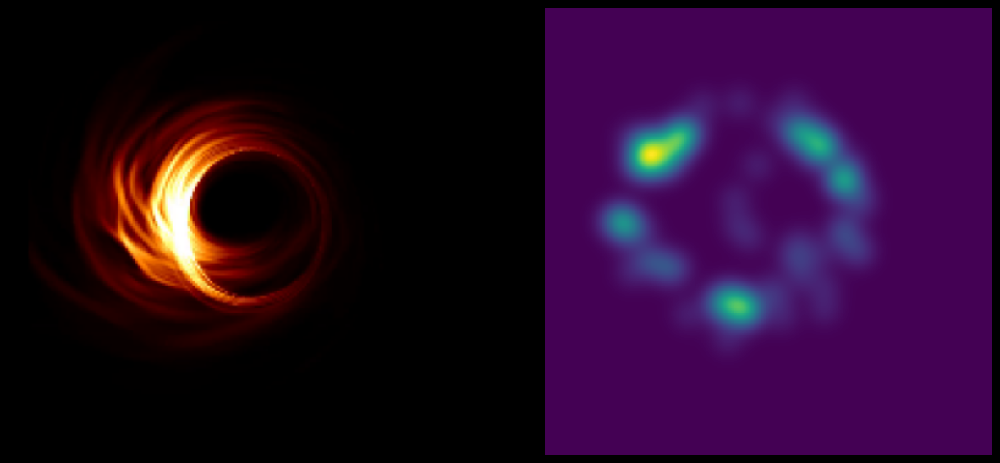

In [106]:
figure,axis = plt.subplots(1,2,figsize=(15,15))
tamanho_IMG = 500 
axis[0].imshow(lista_original[tamanho_IMG])
axis[0].axis("off")
axis[1].imshow(lista_target[tamanho_IMG])
axis[1].axis("off")
# plt.savefig(f"IMG{tamanho_IMG}.png")

(-0.5, 179.5, 179.5, -0.5)

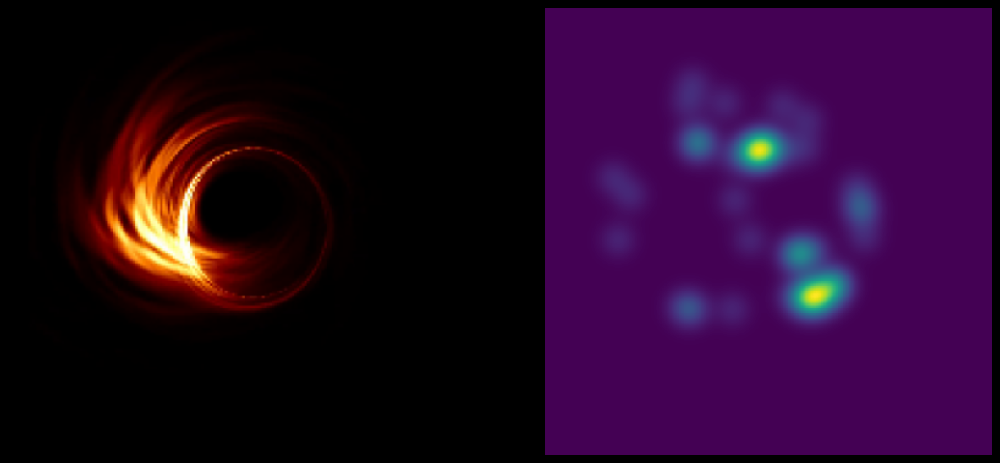

In [107]:
figure,axis = plt.subplots(1,2,figsize=(15,15))
tamanho_IMG = 22 
axis[0].imshow(lista_original[tamanho_IMG])
axis[0].axis("off")
axis[1].imshow(lista_target[tamanho_IMG])
axis[1].axis("off")
# plt.savefig(f"IMG{tamanho_IMG}.png")

(-0.5, 179.5, 179.5, -0.5)

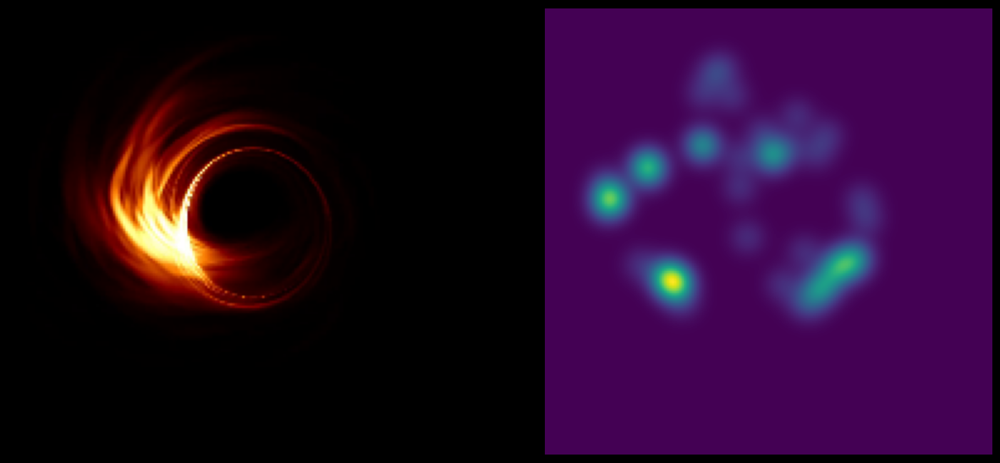

In [108]:
figure,axis = plt.subplots(1,2,figsize=(15,15))
tamanho_IMG = 2 
axis[0].imshow(lista_original[tamanho_IMG])
axis[0].axis("off")
axis[1].imshow(lista_target[tamanho_IMG])
axis[1].axis("off")
# plt.savefig(f"IMG{tamanho_IMG}.png")

(-0.5, 179.5, 179.5, -0.5)

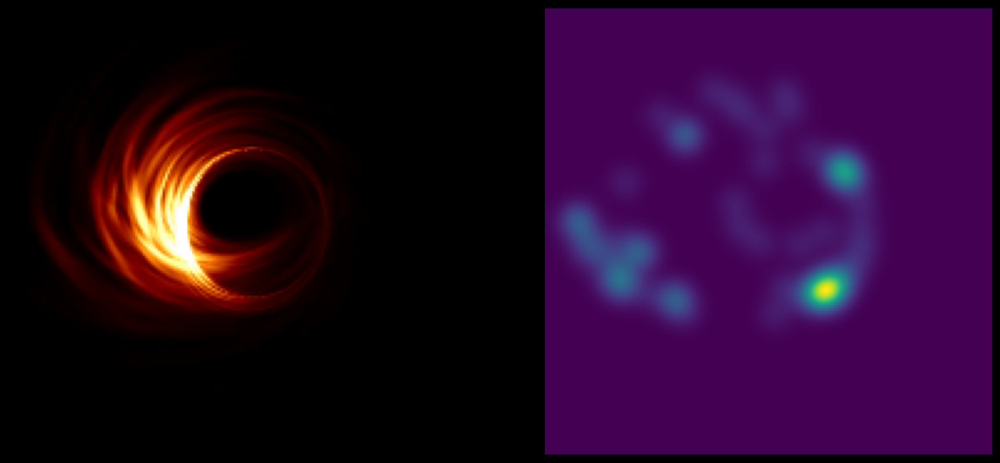

In [109]:
figure,axis = plt.subplots(1,2,figsize=(15,15))
tamanho_IMG = 444 
axis[0].imshow(lista_original[tamanho_IMG])
axis[0].axis("off")
axis[1].imshow(lista_target[tamanho_IMG])
axis[1].axis("off")
# plt.savefig(f"IMG{tamanho_IMG}.png")

(-0.5, 179.5, 179.5, -0.5)

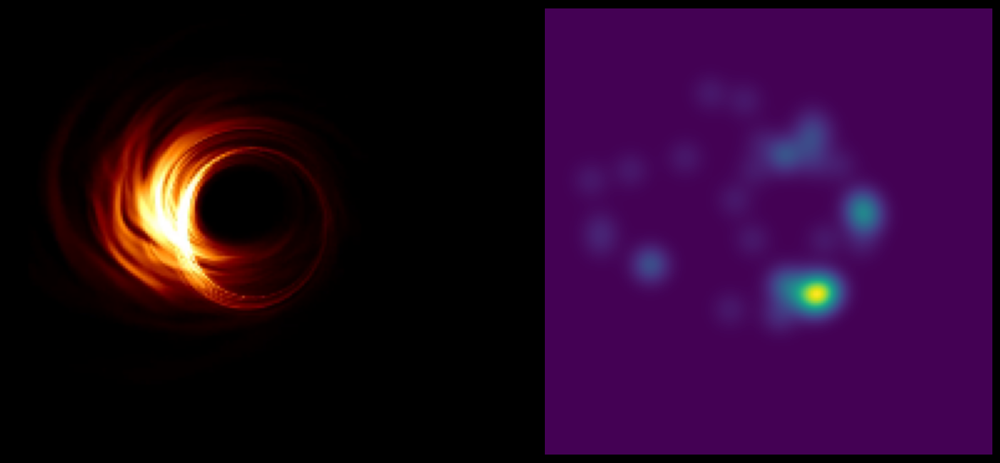

In [110]:
figure,axis = plt.subplots(1,2,figsize=(15,15))
tamanho_IMG = 401 
axis[0].imshow(lista_original[tamanho_IMG])
axis[0].axis("off")
axis[1].imshow(lista_target[tamanho_IMG])
axis[1].axis("off")
# plt.savefig(f"IMG{tamanho_IMG}.png")

(-0.5, 179.5, 179.5, -0.5)

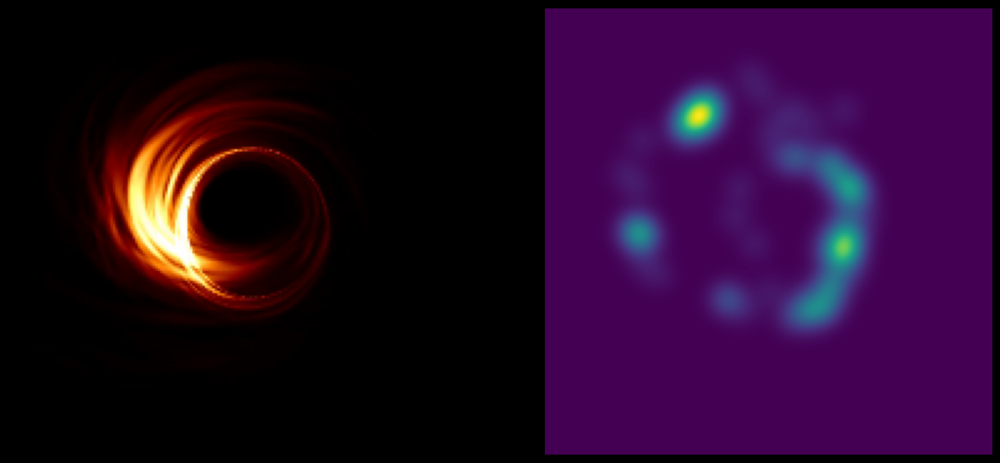

In [111]:
figure,axis = plt.subplots(1,2,figsize=(15,15))
tamanho_IMG = 230 
axis[0].imshow(lista_original[tamanho_IMG])
axis[0].axis("off")
axis[1].imshow(lista_target[tamanho_IMG])
axis[1].axis("off")
# plt.savefig(f"IMG{tamanho_IMG}.png")

Aqui geramos uma extensão dos plots anteriores. Ele cria uma matriz de subplots 5x5, onde cada subplot exibe uma imagem de destino (target) após o processamento das imagens de buracos negros.

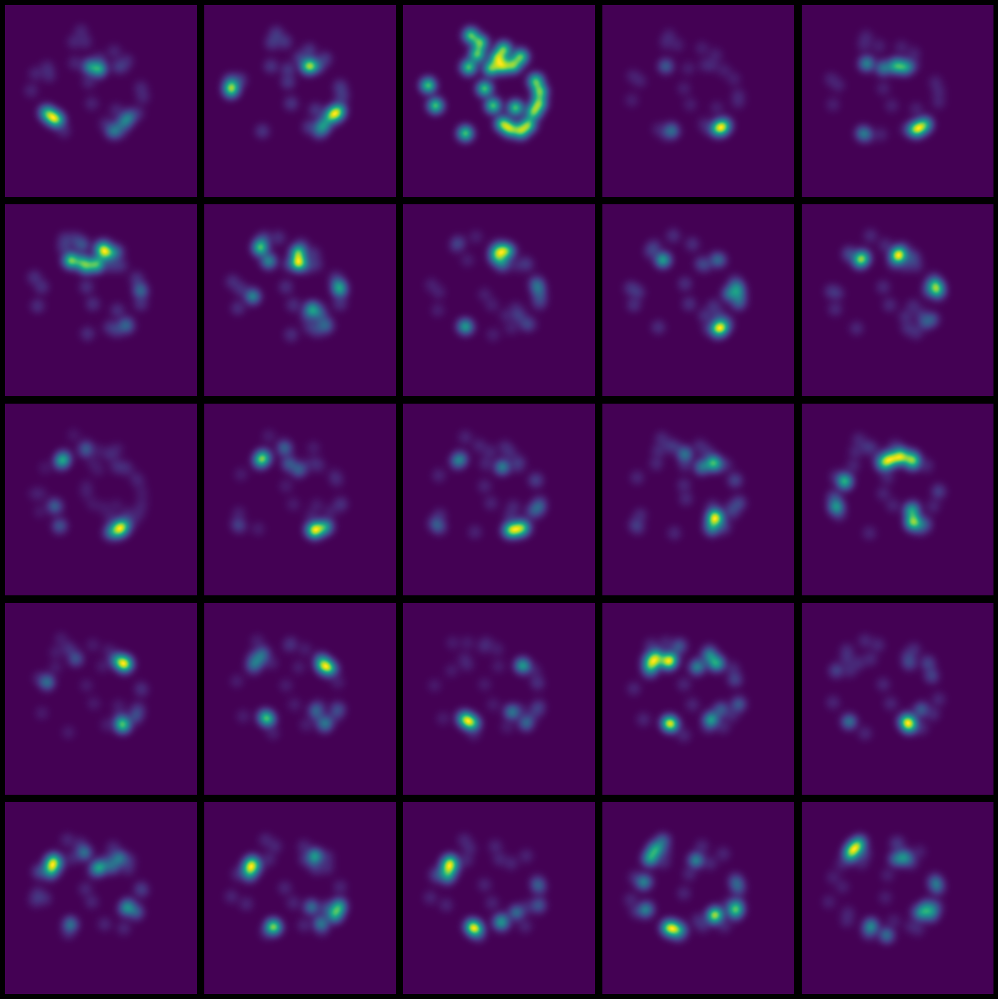

In [112]:
# Cria uma figura e uma matriz de eixos 5x5 com o tamanho da figura especificado
figure, axis = plt.subplots(5, 5, figsize=(20, 20))

# Itera sobre os eixos de forma achatada (em uma única dimensão)
for indexing, operations in enumerate(axis.flat):
    
    # Calcula o índice correspondente na lista de imagens de destino
    index_target = indexing * 5
    
    # Obtém a imagem de destino da lista usando o índice calculado
    indice_acrecao = lista_target[index_target]
    
    # Plota a imagem de destino no eixo atual
    operations.imshow(indice_acrecao)
    
    # Desativa a exibição dos eixos para a imagem atual
    operations.axis("off")
    # plt.savefig(f"IMG_TOTAL{indexing}.png")

# Ajusta automaticamente o layout da figura para melhor visualização
plt.tight_layout()
plt.show()

### 16. PRÉ-PROCESSAMENTO

Este trecho de código converte as listas de imagens lista_original e lista_target em arrays NumPy do tipo float32 e normaliza os valores dos pixels dividindo por 255. Após a execução deste código, os conjuntos de treinamento e transformação estarão prontos para serem usados em um modelo de aprendizado de máquina, com os valores dos pixels normalizados para o intervalo [0, 1]. Isso é comum em tarefas de processamento de imagens para garantir que os dados tenham uma escala consistente e facilitem o treinamento do modelo.

In [113]:
# Converte a lista de imagens original em um array NumPy, especificando o tipo de dados como float32
conj_treino = np.array(lista_original, dtype="float32")

# Converte a lista de imagens de destino em um array NumPy, especificando o tipo de dados como float32
conju_transform = np.array(lista_target, dtype="float32")

# Normaliza os valores dos pixels das imagens de treinamento, dividindo por 255
conj_treino = conj_treino / 255.

# Normaliza os valores dos pixels das imagens de transformação, dividindo por 255
conju_transform = conju_transform / 255.

# Imprime os shapes
print(conj_treino.shape)
print(conju_transform.shape)

(513, 180, 180, 3)
(513, 180, 180)


### 17. MODELO DE REDES NEURAIS

Este callback nós usamos durante o treinamento de redes neurais profundas para evitar a perda de progresso em caso de falha ou interrupção no treinamento. Ele salva o modelo periodicamente com base na métrica monitorada, garantindo que você possa retomar o treinamento do ponto onde parou. 

In [114]:
# Importando a classe ModelCheckpoint do módulo callbacks do Keras
Checkpoint_Model = tf.keras.callbacks.ModelCheckpoint(

    # Monitora a métrica 'val_accuracy' durante o treinamento
    monitor="val_accuracy",

    # Salva apenas o melhor modelo com base na métrica monitorada
    save_best_only=True,

    # Salva apenas os pesos do modelo em vez do modelo inteiro
    save_weights_only=True,

    # Define o caminho onde o modelo será salvo, mantendo a extensão .weights.h5
    filepath="./modelcheck.weights.h5"  
)

Já nesse callback o objetivo é ajustar dinamicamente a taxa de aprendizado durante o treinamento de uma rede neural com base na performance da métrica de validação (val_accuracy). Ele monitora a métrica de validação val_accuracy. Se não houver uma melhoria significativa nessa métrica após um número específico de épocas (definido pelo parâmetro patience), o callback reduzirá a taxa de aprendizado (learning rate) multiplicando-a pelo fator especificado (factor). Isso ajuda a otimizar o treinamento, permitindo uma redução da taxa de aprendizado quando o modelo estiver estagnado, possibilitando uma convergência mais suave.

In [115]:
# Importando a classe ReduceLROnPlateau do módulo callbacks do Keras
Reduce_Model = tf.keras.callbacks.ReduceLROnPlateau(

    # Monitora a métrica 'val_accuracy' durante o treinamento
    monitor="val_accuracy",

    # Fator pelo qual a taxa de aprendizado será reduzida. Por exemplo, nova_lr = lr * factor
    factor=0.02,

    # Mudança mínima necessária para qualificar como uma redução, evitando reduções insignificantes
    min_delta=0.0001,

    # Número de épocas sem melhoria após as quais a taxa de aprendizado será reduzida
    patience=5
)

Configuração dos parâmetros para a compilação do modelo de rede neural

In [116]:
# Função de perda utilizada durante o treinamento (no caso, para classificação binária)
funcao_perda = "binary_crossentropy"

# Otimizador utilizado durante o treinamento (Adam com taxa de aprendizado muito baixa)
comp_otimizado = Adam(learning_rate=0.0000001)  

# Número de classes de saída do modelo (no caso de classificação binária, há uma única classe de saída)
classes_saida = 1

Aqui definimos os modelos do codificador (Encoder_G) e do decodificador (Decoder_G) para uma arquitetura de rede neural convolucional (CNN). O codificador é responsável por mapear a entrada para um espaço de características de dimensão reduzida, enquanto o decodificador reconstrói a saída a partir deste espaço de características. 

- As camadas convolucionais transpostas no decodificador realizam a operação de "upsampling", ou seja, aumentam a resolução espacial da entrada. 
- As camadas de normalização em lote são usadas para melhorar o treinamento da rede, enquanto as camadas de ativação ReLU introduzem não-linearidades na rede.

In [118]:
# Definição do modelo do codificador (Encoder_G)
Encoder_G = Sequential()  # Criação de um modelo sequencial para o codificador
Encoder_G.add(Conv2D(32, (7, 7), kernel_initializer='he_normal', use_bias=True))  # Adição de uma camada convolucional com 32 filtros, tamanho do kernel 7x7 e inicialização dos pesos com he_normal
Encoder_G.add(BatchNormalization())  # Adição de uma camada de normalização em lote para estabilizar e acelerar o treinamento da rede
Encoder_G.add(ReLU())  # Adição de uma camada de ativação ReLU para introduzir a não linearidade

Encoder_G.add(Conv2D(64, (7, 7), kernel_initializer='he_normal', use_bias=True))  # Adição de outra camada convolucional com 64 filtros e tamanho do kernel 7x7
Encoder_G.add(BatchNormalization())  # Novamente, adição de uma camada de normalização em lote
Encoder_G.add(ReLU())  # Outra camada ReLU para introduzir mais não linearidade

Encoder_G.add(Conv2D(128, (2, 2), kernel_initializer='he_normal', use_bias=True))  # Adição de mais uma camada convolucional com 128 filtros e tamanho do kernel 2x2
Encoder_G.add(BatchNormalization())  # Camada de normalização em lote
Encoder_G.add(ReLU())  # Camada de ativação ReLU

# Definição do modelo do decodificador (Decoder_G)
Decoder_G = Sequential()  # Criação de um modelo sequencial para o decodificador
Decoder_G.add(Conv2DTranspose(64, (7, 7)))  # Adição de uma camada de convolução transposta com 64 filtros e tamanho do kernel 7x7
Decoder_G.add(ReLU())  # Camada de ativação ReLU

Decoder_G.add(Conv2DTranspose(32, (7, 7)))  # Adição de outra camada de convolução transposta com 32 filtros e tamanho do kernel 7x7
Decoder_G.add(ReLU())  # Outra camada de ativação ReLU

Decoder_G.add(Conv2DTranspose(classes_saida, (2, 2)))  # Adição da última camada de convolução transposta com número de filtros igual ao número de classes de saída (classes_saida)

Criamos um autoencoder para combinar o modelo do codificador (Encoder_G) e do decodificador (Decoder_G) em um modelo sequencial. Em seguida, o autoencoder é compilado com uma função de perda especificada (funcao_perda), um otimizador (comp_otimizado) e uma métrica de erro quadrático médio (mse) para monitorar o desempenho do modelo durante o treinamento. O objetivo do autoencoder é reconstruir a entrada original na saída, aprendendo uma representação compacta dos dados no processo.

In [119]:
# Criando o autoencoder combinando o codificador e o decodificador
autoencoder = Sequential([Encoder_G, Decoder_G])

# Compilando o autoencoder
autoencoder.compile(loss=funcao_perda,  # Definição da função de perda a ser otimizada durante o treinamento
                     optimizer=comp_otimizado,  # Definição do otimizador para ajustar os pesos da rede durante o treinamento
                     metrics=["mse"])  # Lista de métricas a serem calculadas durante o treinamento (no caso, apenas o erro quadrático médio)

O treinamento é executado ao longo de 25 épocas. Além disso, dois callbacks são passados para o treinamento: Checkpoint_Model e Reduce_Model, que são utilizados para salvar o melhor modelo durante o treinamento e reduzir a taxa de aprendizado caso a métrica monitorada pare de melhorar, respectivamente.

In [120]:
# Treinando o modelo autoencoder
Model_AutoEncoder = autoencoder.fit(
    conj_treino,  # Conjunto de dados de entrada para o treinamento
    conju_transform,  # Conjunto de dados de saída esperado para o treinamento
    epochs=25,  # Número de épocas de treinamento
    callbacks=[Checkpoint_Model, Reduce_Model]  # Lista de callbacks a serem executados durante o treinamento
)

Epoch 1/25


17/17 ━━━━━━━━━━━━━━━━━━━━ 548s 32s/step - loss: 2.0242 - mse: 0.7678 - learning_rate: 1.0000e-07
Epoch 2/25
17/17 ━━━━━━━━━━━━━━━━━━━━ 538s 31s/step - loss: 1.9801 - mse: 0.7420 - learning_rate: 1.0000e-07
Epoch 3/25
17/17 ━━━━━━━━━━━━━━━━━━━━ 553s 32s/step - loss: 1.9392 - mse: 0.7204 - learning_rate: 1.0000e-07
Epoch 4/25
17/17 ━━━━━━━━━━━━━━━━━━━━ 552s 32s/step - loss: 1.9074 - mse: 0.7012 - learning_rate: 1.0000e-07
Epoch 5/25
17/17 ━━━━━━━━━━━━━━━━━━━━ 564s 32s/step - loss: 1.8700 - mse: 0.6815 - learning_rate: 1.0000e-07
Epoch 6/25
17/17 ━━━━━━━━━━━━━━━━━━━━ 564s 32s/step - loss: 1.8290 - mse: 0.6620 - learning_rate: 1.0000e-07
Epoch 7/25
17/17 ━━━━━━━━━━━━━━━━━━━━ 558s 32s/step - loss: 1.7882 - mse: 0.6412 - learning_rate: 1.0000e-07
Epoch 8/25
17/17 ━━━━━━━━━━━━━━━━━━━━ 578s 33s/step - loss: 1.7560 - mse: 0.6244 - learning_rate: 1.0000e-07
Epoch 9/25
17/17 ━━━━━━━━━━━━━━━━━━━━ 549s 32s/step - loss: 1.7205 - mse: 0.6074 - learning_rate: 1.0000e-07
Epoch 10/25
17/17 ━━━━━━━━━━━━

In [121]:
# Realizando a predição utilizando o modelo autoencoder nos dados de treinamento
predicao_IMG = autoencoder.predict(conj_treino)

17/17 ━━━━━━━━━━━━━━━━━━━━ 168s 10s/step


### Exibindo a imagem original e a imagem reconstruída pelo modelo autoencoder

Text(0.5, 1.0, 'PREDIÇÃO PELO MODELO AUTOENCODER')

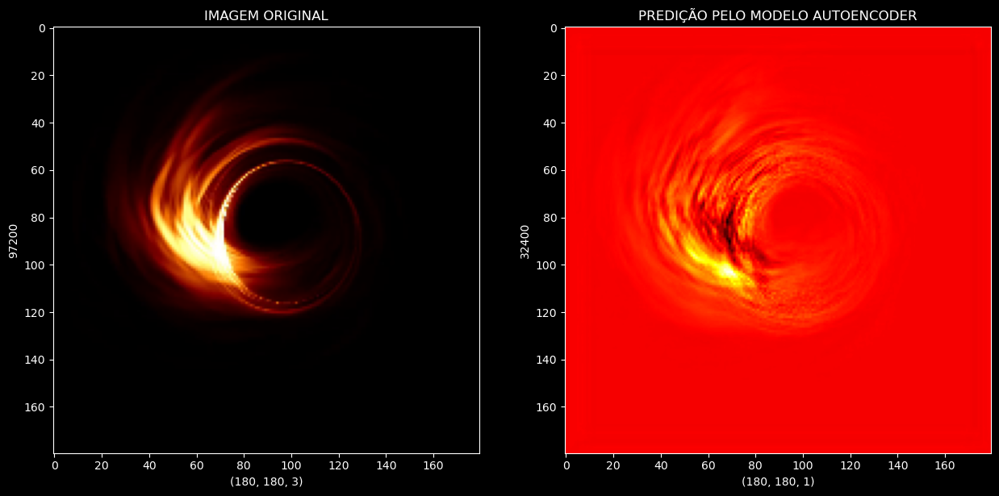

In [122]:
figure, axis = plt.subplots(1, 2, figsize=(15, 15))
predicao_IMG_number = 1

original_IMG = conj_treino[predicao_IMG_number]  # Imagem original
autoencoder_IMG = predicao_IMG[predicao_IMG_number]  # Imagem reconstruída pelo modelo

# Configurações e plotagem da imagem original
axis[0].imshow(original_IMG)
axis[0].set_xlabel(original_IMG.shape)
axis[0].set_ylabel(original_IMG.size)
axis[0].set_title("IMAGEM ORIGINAL")

# Configurações e plotagem da imagem reconstruída
axis[1].imshow(autoencoder_IMG, cmap="hot")
axis[1].set_xlabel(autoencoder_IMG.shape)
axis[1].set_ylabel(autoencoder_IMG.size)
axis[1].set_title("PREDIÇÃO PELO MODELO AUTOENCODER")

Text(0.5, 1.0, 'PREDIÇÃO')

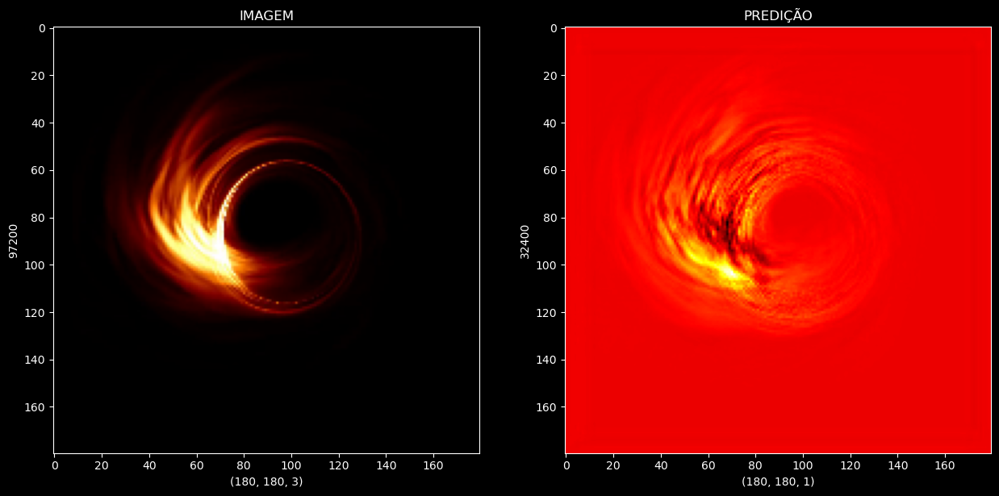

In [123]:
figure,axis = plt.subplots(1,2,figsize=(15,15))
predicao_IMG_number = 5
original_IMG = conj_treino[predicao_IMG_number]
autoencoder_IMG = predicao_IMG[predicao_IMG_number]

axis[0].imshow(original_IMG)
axis[0].set_xlabel(original_IMG.shape)
axis[0].set_ylabel(original_IMG.size)
axis[0].set_title("IMAGEM")
axis[1].imshow(autoencoder_IMG,cmap="hot")
axis[1].set_xlabel(autoencoder_IMG.shape)
axis[1].set_ylabel(autoencoder_IMG.size)
axis[1].set_title("PREDIÇÃO")

Text(0.5, 1.0, 'PREDIÇÃO')

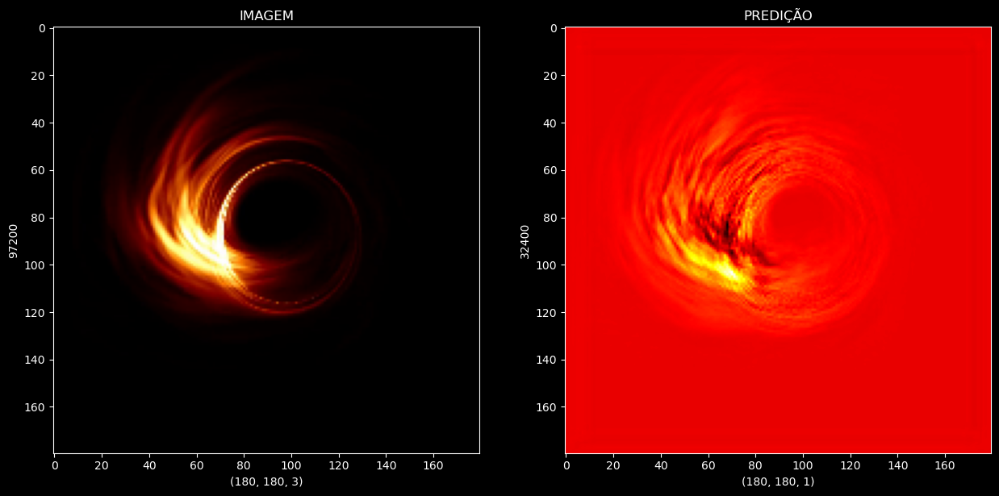

In [124]:
figure,axis = plt.subplots(1,2,figsize=(15,15))
predicao_IMG_number = 8
original_IMG = conj_treino[predicao_IMG_number]
autoencoder_IMG = predicao_IMG[predicao_IMG_number]

axis[0].imshow(original_IMG)
axis[0].set_xlabel(original_IMG.shape)
axis[0].set_ylabel(original_IMG.size)
axis[0].set_title("IMAGEM")
axis[1].imshow(autoencoder_IMG,cmap="hot")
axis[1].set_xlabel(autoencoder_IMG.shape)
axis[1].set_ylabel(autoencoder_IMG.size)
axis[1].set_title("PREDIÇÃO")

Text(0.5, 1.0, 'PREDIÇÃO')

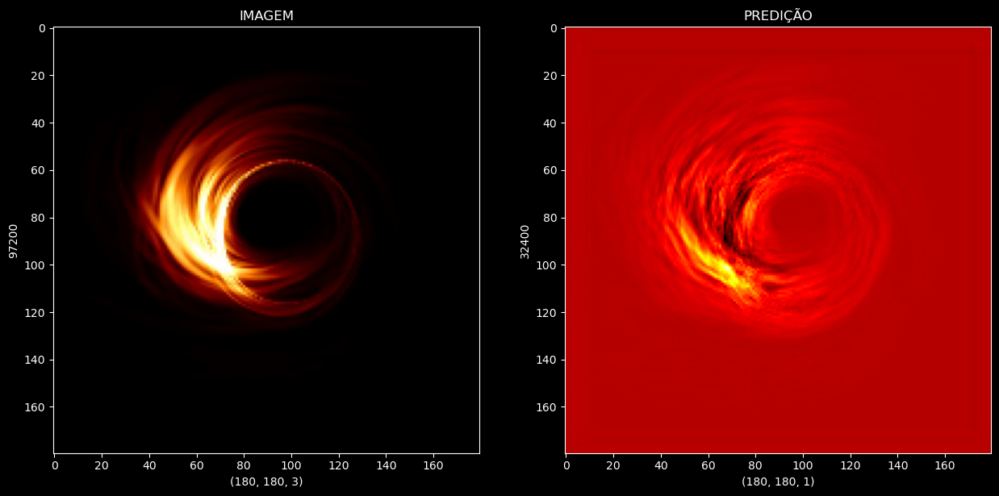

In [125]:
figure,axis = plt.subplots(1,2,figsize=(15,15))
predicao_IMG_number = 250
original_IMG = conj_treino[predicao_IMG_number]
autoencoder_IMG = predicao_IMG[predicao_IMG_number]

axis[0].imshow(original_IMG)
axis[0].set_xlabel(original_IMG.shape)
axis[0].set_ylabel(original_IMG.size)
axis[0].set_title("IMAGEM")
axis[1].imshow(autoencoder_IMG,cmap="hot")
axis[1].set_xlabel(autoencoder_IMG.shape)
axis[1].set_ylabel(autoencoder_IMG.size)
axis[1].set_title("PREDIÇÃO")

Text(0.5, 1.0, 'PREDIÇÃO')

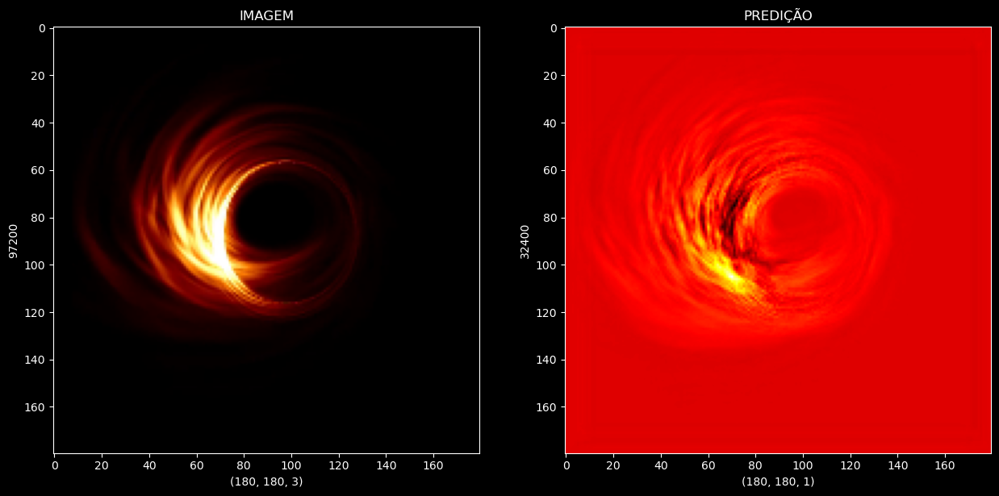

In [126]:
figure,axis = plt.subplots(1,2,figsize=(15,15))
predicao_IMG_number = 444
original_IMG = conj_treino[predicao_IMG_number]
autoencoder_IMG = predicao_IMG[predicao_IMG_number]

axis[0].imshow(original_IMG)
axis[0].set_xlabel(original_IMG.shape)
axis[0].set_ylabel(original_IMG.size)
axis[0].set_title("IMAGEM")
axis[1].imshow(autoencoder_IMG,cmap="hot")
axis[1].set_xlabel(autoencoder_IMG.shape)
axis[1].set_ylabel(autoencoder_IMG.size)
axis[1].set_title("PREDIÇÃO")

Text(0.5, 1.0, 'PREDIÇÃO')

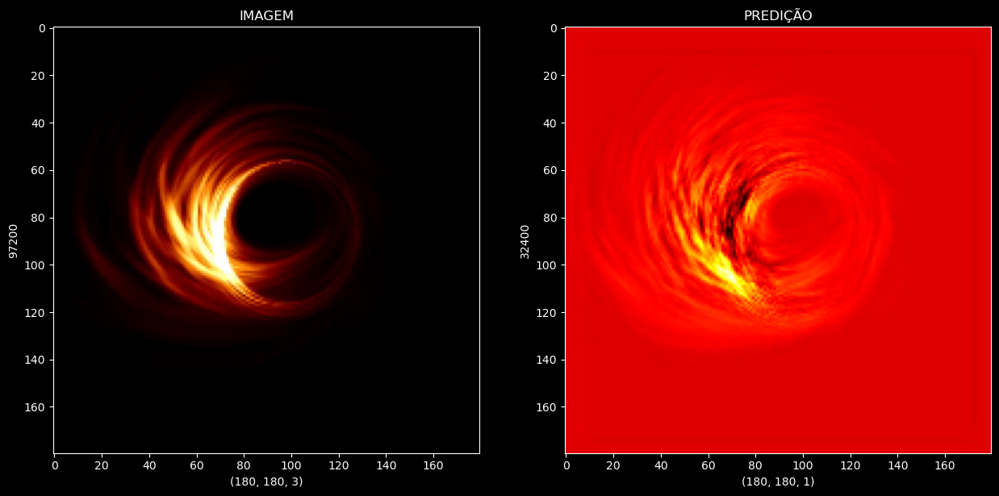

In [127]:
figure,axis = plt.subplots(1,2,figsize=(15,15))
predicao_IMG_number = 450
original_IMG = conj_treino[predicao_IMG_number]
autoencoder_IMG = predicao_IMG[predicao_IMG_number]

axis[0].imshow(original_IMG)
axis[0].set_xlabel(original_IMG.shape)
axis[0].set_ylabel(original_IMG.size)
axis[0].set_title("IMAGEM")
axis[1].imshow(autoencoder_IMG,cmap="hot")
axis[1].set_xlabel(autoencoder_IMG.shape)
axis[1].set_ylabel(autoencoder_IMG.size)
axis[1].set_title("PREDIÇÃO")

Text(0.5, 1.0, 'PREDIÇÃO')

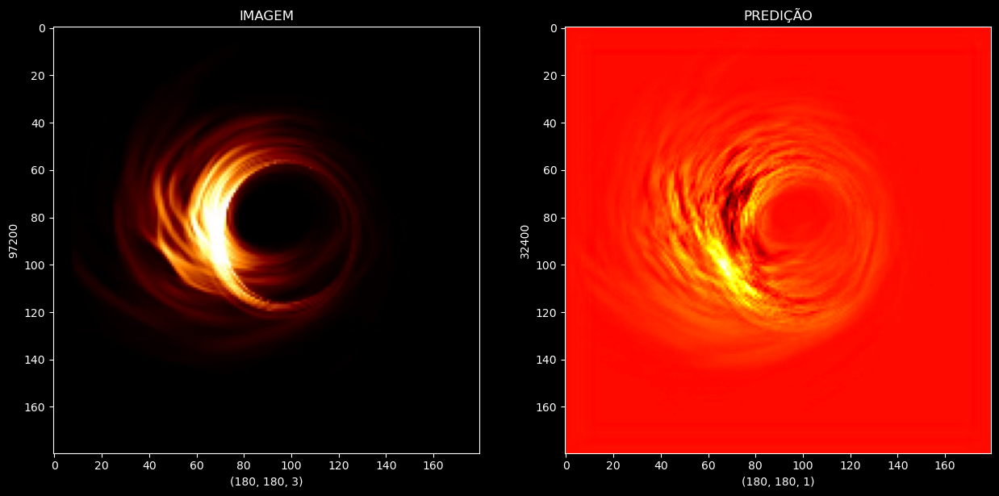

In [128]:
figure,axis = plt.subplots(1,2,figsize=(15,15))
predicao_IMG_number = 500
original_IMG = conj_treino[predicao_IMG_number]
autoencoder_IMG = predicao_IMG[predicao_IMG_number]

axis[0].imshow(original_IMG)
axis[0].set_xlabel(original_IMG.shape)
axis[0].set_ylabel(original_IMG.size)
axis[0].set_title("IMAGEM")
axis[1].imshow(autoencoder_IMG,cmap="hot")
axis[1].set_xlabel(autoencoder_IMG.shape)
axis[1].set_ylabel(autoencoder_IMG.size)
axis[1].set_title("PREDIÇÃO")

Text(0.5, 1.0, 'PREDIÇÃO')

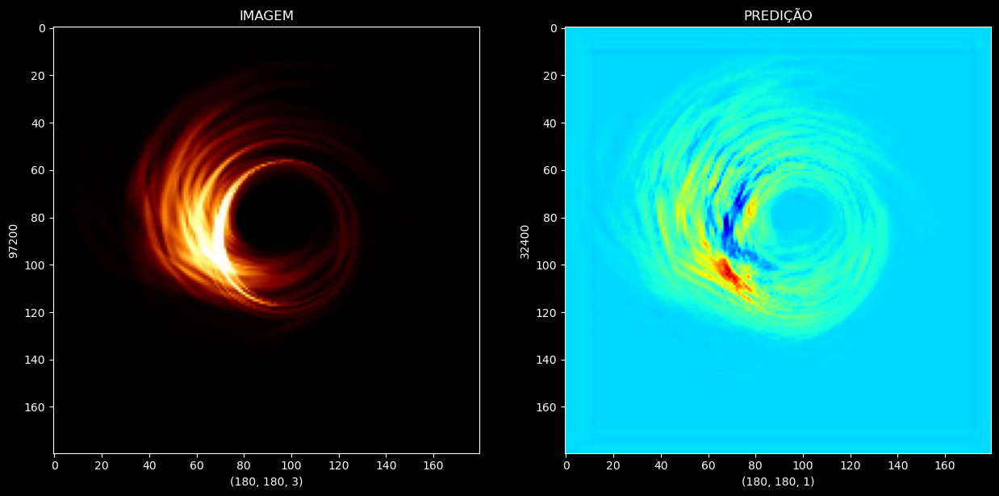

In [129]:
figure,axis = plt.subplots(1,2,figsize=(15,15))
predicao_IMG_number = 288
original_IMG = conj_treino[predicao_IMG_number]
autoencoder_IMG = predicao_IMG[predicao_IMG_number]

axis[0].imshow(original_IMG)
axis[0].set_xlabel(original_IMG.shape)
axis[0].set_ylabel(original_IMG.size)
axis[0].set_title("IMAGEM")
axis[1].imshow(autoencoder_IMG,cmap="jet")
axis[1].set_xlabel(autoencoder_IMG.shape)
axis[1].set_ylabel(autoencoder_IMG.size)
axis[1].set_title("PREDIÇÃO")

Text(0.5, 1.0, 'PREDIÇÃO')

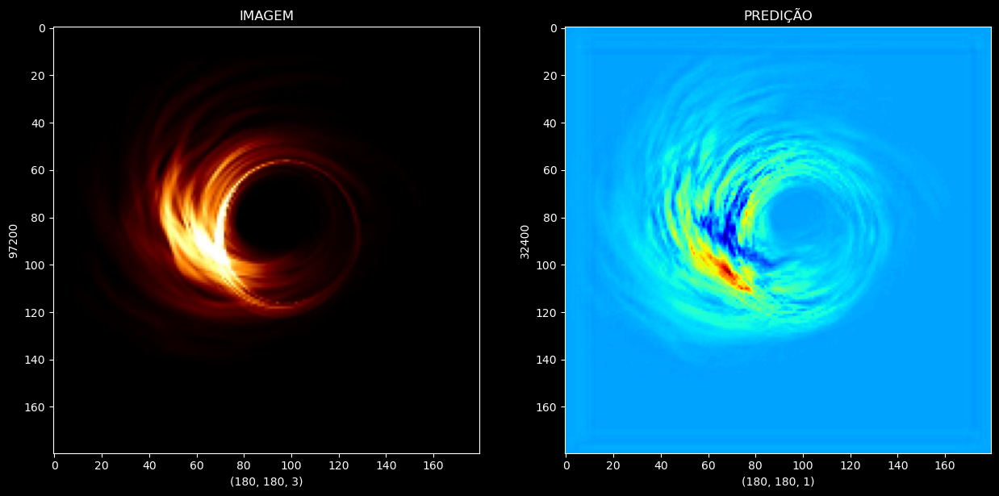

In [130]:
figure,axis = plt.subplots(1,2,figsize=(15,15))
predicao_IMG_number = 88
original_IMG = conj_treino[predicao_IMG_number]
autoencoder_IMG = predicao_IMG[predicao_IMG_number]

axis[0].imshow(original_IMG)
axis[0].set_xlabel(original_IMG.shape)
axis[0].set_ylabel(original_IMG.size)
axis[0].set_title("IMAGEM")
axis[1].imshow(autoencoder_IMG,cmap="jet")
axis[1].set_xlabel(autoencoder_IMG.shape)
axis[1].set_ylabel(autoencoder_IMG.size)
axis[1].set_title("PREDIÇÃO")

Text(0.5, 1.0, 'PREDIÇÃO')

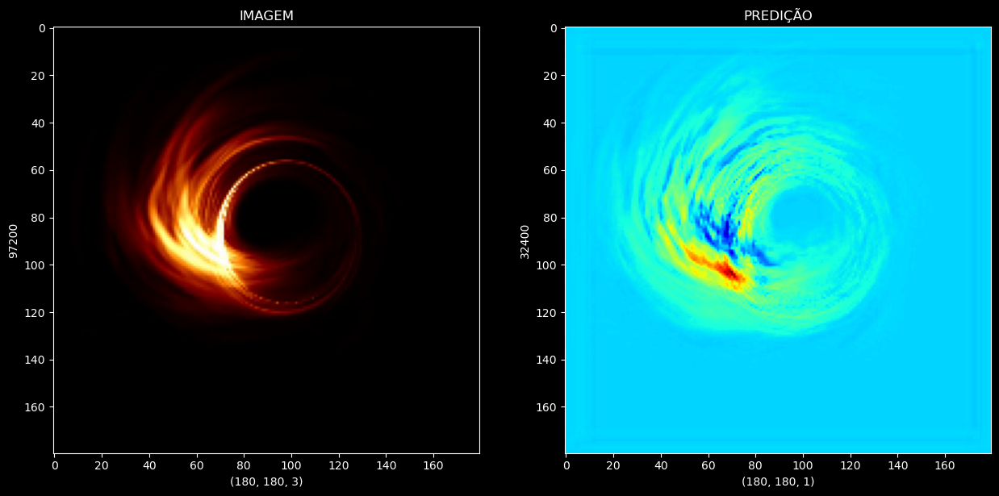

In [131]:
figure,axis = plt.subplots(1,2,figsize=(15,15))
predicao_IMG_number = 8
original_IMG = conj_treino[predicao_IMG_number]
autoencoder_IMG = predicao_IMG[predicao_IMG_number]

axis[0].imshow(original_IMG)
axis[0].set_xlabel(original_IMG.shape)
axis[0].set_ylabel(original_IMG.size)
axis[0].set_title("IMAGEM")
axis[1].imshow(autoencoder_IMG,cmap="jet")
axis[1].set_xlabel(autoencoder_IMG.shape)
axis[1].set_ylabel(autoencoder_IMG.size)
axis[1].set_title("PREDIÇÃO")

Text(0.5, 1.0, 'PREDIÇÃO')

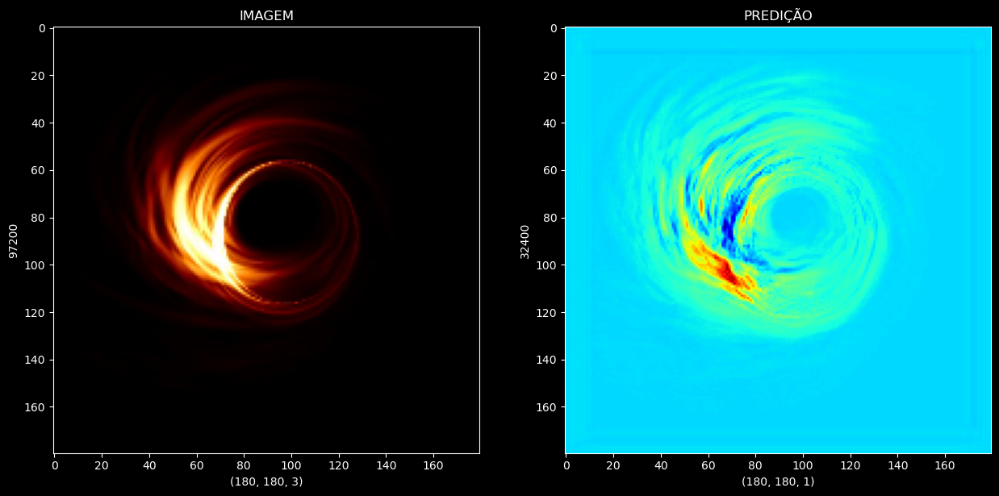

In [132]:
figure,axis = plt.subplots(1,2,figsize=(15,15))
predicao_IMG_number = 221
original_IMG = conj_treino[predicao_IMG_number]
autoencoder_IMG = predicao_IMG[predicao_IMG_number]

axis[0].imshow(original_IMG)
axis[0].set_xlabel(original_IMG.shape)
axis[0].set_ylabel(original_IMG.size)
axis[0].set_title("IMAGEM")
axis[1].imshow(autoencoder_IMG,cmap="jet")
axis[1].set_xlabel(autoencoder_IMG.shape)
axis[1].set_ylabel(autoencoder_IMG.size)
axis[1].set_title("PREDIÇÃO")

## FIM

Neste projeto de análise de buracos negros, uma série de técnicas de processamento de imagens foram aplicadas para alcançar diversos objetivos. Inicialmente, o foco foi na identificação e segmentação dos buracos negros em imagens astronômicas, utilizando limiares e contornos para destacar essas regiões de interesse. Em seguida, técnicas de pré-processamento, como filtragem gaussiana e esqueletização, foram empregadas para melhorar a qualidade das imagens e extrair características relevantes dos buracos negros.

Além disso, foram exploradas análises mais avançadas, como o cálculo do espectro Hessiano para identificar estruturas significativas nas imagens e a medição de distâncias entre pontos de singularidade e braços espirais. Essas análises forneceram insights valiosos sobre a distribuição e características dos buracos negros em diferentes contextos astronômicos.

A comparação entre as imagens originais e os targets, após o processamento, permitiu avaliar a eficácia das técnicas aplicadas e entender as transformações realizadas nas imagens de buracos negros. Por fim, a visualização das imagens em uma matriz de subplots possibilitou uma análise mais abrangente e uma compreensão mais completa dos resultados obtidos.

Em resumo, este projeto demonstrou como técnicas de processamento de imagens podem ser aplicadas de forma eficaz para análise e caracterização de buracos negros em imagens astronômicas, contribuindo para o avanço do conhecimento científico nessa área fascinante da astronomia.

Espero que seja relevante para você, até a próxima!